In [0]:
!wget https://onti-2019.s3-eu-central-1.amazonaws.com/public/data_v1.zip
!unzip data_v1.zip

--2020-01-08 20:08:55--  https://onti-2019.s3-eu-central-1.amazonaws.com/public/data_v1.zip
Resolving onti-2019.s3-eu-central-1.amazonaws.com (onti-2019.s3-eu-central-1.amazonaws.com)... 52.219.73.85
Connecting to onti-2019.s3-eu-central-1.amazonaws.com (onti-2019.s3-eu-central-1.amazonaws.com)|52.219.73.85|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 251394680 (240M) [binary/octet-stream]
Saving to: ‘data_v1.zip’

data_v1.zip         100%[===================>] 239.75M  26.2MB/s    in 9.8s    

2020-01-08 20:09:11 (24.4 MB/s) - ‘data_v1.zip’ saved [251394680/251394680]

Archive:  data_v1.zip
   creating: data/
  inflating: data/test.csv           
   creating: __MACOSX/
   creating: __MACOSX/data/
  inflating: __MACOSX/data/._test.csv  
  inflating: data/small_group_description.csv  
  inflating: __MACOSX/data/._small_group_description.csv  
  inflating: data/train_target.csv   
  inflating: __MACOSX/data/._train_target.csv  
  inflating: data/transactions_

# New Section

Импортируем нужные библиотеки.

In [0]:
import pandas as pd
import xgboost as xgb

Распакуйте архив с данными в папку,где находится этот jupyter notebook (baseline.ipynb). У вас будет папка data,  содержащая необходимые файлы. 

В данном соревновании перед вами ставится задача предсказания категории возраста, к которой принадлежит клиент банка, на основании его транзакций.
В обучающем наборе содержатся информация по транзакциям 30000 клиентов, она находится в файле **transactions_train.csv**. Правильная категория возраста для обучающего набора находится в файле **train_target.csv**.

Считаем данные по транзакциям и правильные ответы.

In [0]:
transactions_train=pd.read_csv('data/transactions_train.csv')
train_target=pd.read_csv('data/train_target.csv')

agg_features=transactions_train.groupby('client_id')['amount_rur'].agg(['sum','mean','std','min','max']).reset_index()
counter_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].count()

cat_counts_train=counter_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_counts_train=cat_counts_train.fillna(0)
cat_counts_train.columns=['small_group_'+str(i) for i in cat_counts_train.columns]

train=pd.merge(train_target,agg_features,on='client_id')
train=pd.merge(train,cat_counts_train.reset_index(),on='client_id')

transactions_test=pd.read_csv('data/transactions_test.csv')

test_id=pd.read_csv('data/test.csv')
agg_features_test=transactions_test.groupby('client_id')['amount_rur'].agg(['sum','mean','std','min','max']).reset_index()

counter_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].count()
cat_counts_test=counter_df_test.reset_index().pivot(index='client_id', columns='small_group',values='amount_rur')
cat_counts_test=cat_counts_test.fillna(0)
cat_counts_test.columns=['small_group_'+str(i) for i in cat_counts_test.columns]

test=pd.merge(test_id,agg_features_test,on='client_id')
test=pd.merge(test,cat_counts_test.reset_index(),on='client_id')

In [0]:
transactions_train=pd.read_csv('data/transactions_train.csv')
train_target=pd.read_csv('data/train_target.csv')

In [0]:
train_target=pd.read_csv('data/train_target.csv')

Посмотрим на данные.

In [0]:
transactions_train.head()

,client_id,trans_date,small_group,amount_rur
0,33172,6,4,71.463
1,33172,6,35,45.017
2,33172,8,11,13.887
3,33172,9,11,15.983
4,33172,10,11,21.341


* client_id - уникальный идентификатор клиента
* trans_date - дата совершения транзакции
* small_group - категория покупки
* amount_rur - сумма транзакции

In [0]:
transactions_train.shape

(26450577, 4)

In [0]:
train_target.head(5)

,client_id,bins
0,24662,2
1,1046,0
2,34089,2
3,34848,1
4,47076,3


* client_id - уникальный идентификатор клиента, соответствует полю client_id из транзакций
* bins - целевая переменная, которую нужно предсказать, это категория возраста клиента

Далее представлен простой вариант решения задачи. Вы можете решать соревнование используя совершенно другой подход.

Посчитаем по каждому клиенту самые простые аггрегационные признаки.

In [0]:
agg_features=transactions_train.groupby('client_id')['amount_rur'].agg(['sum','mean','std','min','max','median',('mode', lambda x: x.mode()[0])]).reset_index()

In [0]:
agg_features.head()

,client_id,sum,mean,std,min,max,median,mode,skew
0,4,28404.121,39.450168,73.511624,0.043,1341.802,22.725,29.767,9.880610
1,6,15720.739,21.535259,26.200397,0.045,315.781,13.898,8.625,5.663898
2,7,53630.036,69.379089,253.261383,0.043,4505.971,27.477,2.846,13.231306
3,10,34419.365,48.752642,63.191701,0.045,654.893,32.057,22.898,4.448242
4,11,26789.404,32.991877,107.395139,0.388,2105.058,11.066,2.290,11.578709


Посчитаем для каждого клиента количество транзакций по каждой категории.

In [0]:
counter_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].count()

In [0]:
counter_df_train.head()

client_id  small_group
4          1              447
           2                1
           3               44
           4               93
           8                1
Name: amount_rur, dtype: int64

In [0]:
cat_counts_train=counter_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')

In [0]:
cat_counts_train.head()

small_group,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,195,196,197,198,199,200,202,203
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,NaN,447.0,1.0,44.0,93.0,NaN,NaN,NaN,1.0,13.0,1.0,19.0,NaN,NaN,NaN,37.0,NaN,NaN,5.0,NaN,2.0,NaN,NaN,3.0,6.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,2.0,NaN,9.0,NaN,12.0,NaN,NaN,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2.0,397.0,NaN,172.0,10.0,NaN,NaN,NaN,NaN,6.0,3.0,9.0,NaN,NaN,NaN,103.0,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,1.0,NaN,NaN,NaN,2.0,NaN,NaN,5.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2.0,79.0,5.0,27.0,19.0,1.0,NaN,2.0,1.0,39.0,NaN,187.0,136.0,5.0,NaN,15.0,3.0,NaN,64.0,3.0,NaN,3.0,2.0,7.0,15.0,55.0,NaN,NaN,6.0,NaN,NaN,1.0,1.0,2.0,8.0,5.0,16.0,5.0,NaN,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,12.0,309.0,1.0,71.0,65.0,NaN,NaN,NaN,3.0,19.0,NaN,58.0,NaN,NaN,NaN,40.0,NaN,NaN,6.0,2.0,NaN,NaN,NaN,3.0,26.0,11.0,NaN,NaN,6.0,NaN,1.0,2.0,NaN,NaN,8.0,NaN,27.0,NaN,NaN,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,2.0,423.0,NaN,59.0,23.0,3.0,NaN,NaN,NaN,10.0,4.0,107.0,NaN,1.0,NaN,7.0,1.0,NaN,22.0,NaN,1.0,1.0,18.0,3.0,14.0,17.0,3.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,10.0,14.0,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
cat_counts_train=cat_counts_train.fillna(0)

In [0]:
cat_counts_train.columns=['small_group_'+str(i) for i in cat_counts_train.columns]

In [0]:
cat_counts_train.head()

,small_group_0,small_group_1,small_group_2,small_group_3,small_group_4,small_group_5,small_group_6,small_group_7,small_group_8,small_group_9,small_group_10,small_group_11,small_group_12,small_group_13,small_group_14,small_group_15,small_group_16,small_group_17,small_group_18,small_group_19,small_group_20,small_group_21,small_group_22,small_group_23,small_group_24,small_group_25,small_group_26,small_group_27,small_group_28,small_group_29,small_group_30,small_group_31,small_group_32,small_group_33,small_group_34,small_group_35,small_group_36,small_group_37,small_group_38,small_group_39,...,small_group_162,small_group_163,small_group_164,small_group_165,small_group_166,small_group_167,small_group_168,small_group_169,small_group_170,small_group_171,small_group_172,small_group_173,small_group_174,small_group_175,small_group_176,small_group_177,small_group_178,small_group_179,small_group_180,small_group_181,small_group_182,small_group_183,small_group_184,small_group_185,small_group_186,small_group_187,small_group_188,small_group_189,small_group_190,small_group_191,small_group_192,small_group_193,small_group_195,small_group_196,small_group_197,small_group_198,small_group_199,small_group_200,small_group_202,small_group_203
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.0,447.0,1.0,44.0,93.0,0.0,0.0,0.0,1.0,13.0,1.0,19.0,0.0,0.0,0.0,37.0,0.0,0.0,5.0,0.0,2.0,0.0,0.0,3.0,6.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,9.0,0.0,12.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2.0,397.0,0.0,172.0,10.0,0.0,0.0,0.0,0.0,6.0,3.0,9.0,0.0,0.0,0.0,103.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2.0,79.0,5.0,27.0,19.0,1.0,0.0,2.0,1.0,39.0,0.0,187.0,136.0,5.0,0.0,15.0,3.0,0.0,64.0,3.0,0.0,3.0,2.0,7.0,15.0,55.0,0.0,0.0,6.0,0.0,0.0,1.0,1.0,2.0,8.0,5.0,16.0,5.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,12.0,309.0,1.0,71.0,65.0,0.0,0.0,0.0,3.0,19.0,0.0,58.0,0.0,0.0,0.0,40.0,0.0,0.0,6.0,2.0,0.0,0.0,0.0,3.0,26.0,11.0,0.0,0.0,6.0,0.0,1.0,2.0,0.0,0.0,8.0,0.0,27.0,0.0,0.0,12.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,2.0,423.0,0.0,59.0,23.0,3.0,0.0,0.0,0.0,10.0,4.0,107.0,0.0,1.0,0.0,7.0,1.0,0.0,22.0,0.0,1.0,1.0,18.0,3.0,14.0,17.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,10.0,14.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##MEAN

In [0]:
mean_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].mean()

In [0]:
mean_df_train.head()

client_id  small_group
4          1              33.668673
           2              98.966000
           3              18.986432
           4              40.855613
           8              22.852000
Name: amount_rur, dtype: float64

In [0]:
cat_mean_train=mean_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_mean_train=cat_mean_train.fillna(0)
cat_mean_train.columns=['small_group_'+str(i)+'_mean' for i in cat_mean_train.columns]

In [0]:
cat_mean_train.head()

,small_group_0_mean,small_group_1_mean,small_group_2_mean,small_group_3_mean,small_group_4_mean,small_group_5_mean,small_group_6_mean,small_group_7_mean,small_group_8_mean,small_group_9_mean,small_group_10_mean,small_group_11_mean,small_group_12_mean,small_group_13_mean,small_group_14_mean,small_group_15_mean,small_group_16_mean,small_group_17_mean,small_group_18_mean,small_group_19_mean,small_group_20_mean,small_group_21_mean,small_group_22_mean,small_group_23_mean,small_group_24_mean,small_group_25_mean,small_group_26_mean,small_group_27_mean,small_group_28_mean,small_group_29_mean,small_group_30_mean,small_group_31_mean,small_group_32_mean,small_group_33_mean,small_group_34_mean,small_group_35_mean,small_group_36_mean,small_group_37_mean,small_group_38_mean,small_group_39_mean,...,small_group_162_mean,small_group_163_mean,small_group_164_mean,small_group_165_mean,small_group_166_mean,small_group_167_mean,small_group_168_mean,small_group_169_mean,small_group_170_mean,small_group_171_mean,small_group_172_mean,small_group_173_mean,small_group_174_mean,small_group_175_mean,small_group_176_mean,small_group_177_mean,small_group_178_mean,small_group_179_mean,small_group_180_mean,small_group_181_mean,small_group_182_mean,small_group_183_mean,small_group_184_mean,small_group_185_mean,small_group_186_mean,small_group_187_mean,small_group_188_mean,small_group_189_mean,small_group_190_mean,small_group_191_mean,small_group_192_mean,small_group_193_mean,small_group_195_mean,small_group_196_mean,small_group_197_mean,small_group_198_mean,small_group_199_mean,small_group_200_mean,small_group_202_mean,small_group_203_mean
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.0000,33.668673,98.9660,18.986432,40.855613,0.000000,0.0,0.0000,22.852,39.604692,4.16700,10.107947,0.000000,0.0000,0.0,20.997865,0.000,0.0,27.760000,0.000,362.893,0.000,0.000000,94.140333,70.402667,0.000000,0.000000,0.0,12.8950,0.0,0.000,0.0000,28.064,0.000,13.901222,0.000,20.385167,0.0000,0.0,485.800667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,26.6860,24.188338,0.0000,16.890017,18.948000,0.000000,0.0,0.0000,0.000,13.365500,49.18500,26.847111,0.000000,0.0000,0.0,9.537845,0.000,0.0,14.425000,0.000,102.664,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,101.3500,0.0,13.671,0.0000,0.000,0.000,11.142500,0.000,0.000000,6.0912,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,44.5360,58.637620,25.1042,32.908259,34.736947,1241.557000,0.0,59.4875,197.820,91.507128,0.00000,37.456610,27.358213,1084.7732,0.0,10.191733,331.101,0.0,96.567984,86.744,0.000,100.474,52.035000,82.147571,111.848067,12.098327,0.000000,0.0,1574.8245,0.0,0.000,26.7390,76.936,32.119,16.103375,18.229,104.803812,90.5144,0.0,77.557667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,53.3165,43.496783,24.9280,28.658648,37.271985,0.000000,0.0,0.0000,90.110,38.049000,0.00000,39.913259,0.000000,0.0000,0.0,34.855225,0.000,0.0,23.599667,34.848,0.000,0.000,0.000000,184.571667,119.375154,55.166545,0.000000,0.0,208.6440,0.0,3.435,65.7695,0.000,0.000,32.494750,0.000,47.886556,0.0000,0.0,70.003000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,44.1195,11.908482,0.0000,10.805525,7.757522,614.822667,0.0,0.0000,0.000,8.699000,48.07275,15.935636,0.000000,38.8150,0.0,6.707571,2.463,0.0,34.032045,0.000,31.420,108.077,116.670722,102.151333,71.750071,113.517000,131.081667,0.0,0.0000,0.0,0.000,0.0000,115.151,0.000,31.267500,24.719,58.602071,0.0000,0.0,83.667000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

##STD

In [0]:
std_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].std()
cat_std_train=std_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_std_train=cat_std_train.fillna(0)
cat_std_train.columns=['small_group_'+str(i)+'_std' for i in cat_std_train.columns]
cat_std_train.head()

,small_group_0_std,small_group_1_std,small_group_2_std,small_group_3_std,small_group_4_std,small_group_5_std,small_group_6_std,small_group_7_std,small_group_8_std,small_group_9_std,small_group_10_std,small_group_11_std,small_group_12_std,small_group_13_std,small_group_14_std,small_group_15_std,small_group_16_std,small_group_17_std,small_group_18_std,small_group_19_std,small_group_20_std,small_group_21_std,small_group_22_std,small_group_23_std,small_group_24_std,small_group_25_std,small_group_26_std,small_group_27_std,small_group_28_std,small_group_29_std,small_group_30_std,small_group_31_std,small_group_32_std,small_group_33_std,small_group_34_std,small_group_35_std,small_group_36_std,small_group_37_std,small_group_38_std,small_group_39_std,...,small_group_162_std,small_group_163_std,small_group_164_std,small_group_165_std,small_group_166_std,small_group_167_std,small_group_168_std,small_group_169_std,small_group_170_std,small_group_171_std,small_group_172_std,small_group_173_std,small_group_174_std,small_group_175_std,small_group_176_std,small_group_177_std,small_group_178_std,small_group_179_std,small_group_180_std,small_group_181_std,small_group_182_std,small_group_183_std,small_group_184_std,small_group_185_std,small_group_186_std,small_group_187_std,small_group_188_std,small_group_189_std,small_group_190_std,small_group_191_std,small_group_192_std,small_group_193_std,small_group_195_std,small_group_196_std,small_group_197_std,small_group_198_std,small_group_199_std,small_group_200_std,small_group_202_std,small_group_203_std
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000000,38.667780,0.000000,12.590607,42.186872,0.00000,0.0,0.000000,0.00000,24.380255,0.000000,11.016912,0.000000,0.000000,0.0,21.707585,0.000000,0.0,35.613717,0.000000,446.178722,0.000000,0.000000,143.334922,44.622158,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,3.703825,0.000000,9.093696,0.000000,14.446880,0.000000,0.0,741.320928,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,26.179921,21.069160,0.000000,16.568673,16.307055,0.00000,0.0,0.000000,0.00000,12.145768,8.280110,15.230154,0.000000,0.000000,0.0,8.546298,0.000000,0.0,0.000000,0.000000,13.587764,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,143.881225,0.0,0.0,0.000000,0.000000,0.000000,7.539880,0.000000,0.000000,3.829210,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,34.163157,100.119074,26.087731,19.558137,21.581210,0.00000,0.0,25.245833,0.00000,82.377793,0.000000,42.489281,22.887976,1619.797138,0.0,9.840310,319.911382,0.0,115.724754,93.592221,0.000000,85.650726,55.291508,43.018928,79.792405,20.908684,0.000000,0.0,1711.241873,0.0,0.0,0.000000,0.000000,20.812981,7.519892,9.456398,102.553388,69.847982,0.0,25.833512,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,36.145495,45.744092,0.000000,31.354423,32.220690,0.00000,0.0,0.000000,64.01453,72.811924,0.000000,22.678074,0.000000,0.000000,0.0,29.868967,0.000000,0.0,21.563467,27.261795,0.000000,0.000000,0.000000,126.046844,114.028974,36.746673,0.000000,0.0,262.956493,0.0,0.0,3.355222,0.000000,0.000000,25.098847,0.000000,59.294143,0.000000,0.0,49.024114,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,44.706826,14.420545,0.000000,16.777143,11.219983,305.56905,0.0,0.000000,0.00000,8.461579,38.075192,10.505325,0.000000,0.000000,0.0,4.194436,0.000000,0.0,25.711951,0.000000,0.000000,0.000000,95.700145,111.547004,37.489240,181.069013,215.702339,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,39.461508,19.780266,62.49002

##SUM

In [0]:
sum_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].sum()
cat_sum_train=sum_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_sum_train=cat_sum_train.fillna(0)
cat_sum_train.columns=['small_group_'+str(i)+'_sum' for i in cat_sum_train.columns]
cat_sum_train.head()

,small_group_0_sum,small_group_1_sum,small_group_2_sum,small_group_3_sum,small_group_4_sum,small_group_5_sum,small_group_6_sum,small_group_7_sum,small_group_8_sum,small_group_9_sum,small_group_10_sum,small_group_11_sum,small_group_12_sum,small_group_13_sum,small_group_14_sum,small_group_15_sum,small_group_16_sum,small_group_17_sum,small_group_18_sum,small_group_19_sum,small_group_20_sum,small_group_21_sum,small_group_22_sum,small_group_23_sum,small_group_24_sum,small_group_25_sum,small_group_26_sum,small_group_27_sum,small_group_28_sum,small_group_29_sum,small_group_30_sum,small_group_31_sum,small_group_32_sum,small_group_33_sum,small_group_34_sum,small_group_35_sum,small_group_36_sum,small_group_37_sum,small_group_38_sum,small_group_39_sum,...,small_group_162_sum,small_group_163_sum,small_group_164_sum,small_group_165_sum,small_group_166_sum,small_group_167_sum,small_group_168_sum,small_group_169_sum,small_group_170_sum,small_group_171_sum,small_group_172_sum,small_group_173_sum,small_group_174_sum,small_group_175_sum,small_group_176_sum,small_group_177_sum,small_group_178_sum,small_group_179_sum,small_group_180_sum,small_group_181_sum,small_group_182_sum,small_group_183_sum,small_group_184_sum,small_group_185_sum,small_group_186_sum,small_group_187_sum,small_group_188_sum,small_group_189_sum,small_group_190_sum,small_group_191_sum,small_group_192_sum,small_group_193_sum,small_group_195_sum,small_group_196_sum,small_group_197_sum,small_group_198_sum,small_group_199_sum,small_group_200_sum,small_group_202_sum,small_group_203_sum
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000,15049.897,98.966,835.403,3799.572,0.000,0.0,0.000,22.852,514.861,4.167,192.051,0.000,0.000,0.0,776.921,0.000,0.0,138.800,0.000,725.786,0.000,0.000,282.421,422.416,0.000,0.000,0.0,12.895,0.0,0.000,0.000,56.128,0.000,125.111,0.000,244.622,0.000,0.0,1457.402,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,53.372,9602.770,0.000,2905.083,189.480,0.000,0.0,0.000,0.000,80.193,147.555,241.624,0.000,0.000,0.0,982.398,0.000,0.0,14.425,0.000,205.328,0.000,0.000,0.000,0.000,0.000,0.000,0.0,304.050,0.0,13.671,0.000,0.000,0.000,22.285,0.000,0.000,30.456,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,89.072,4632.372,125.521,888.523,660.002,1241.557,0.0,118.975,197.820,3568.778,0.000,7004.386,3720.717,5423.866,0.0,152.876,993.303,0.0,6180.351,260.232,0.000,301.422,104.070,575.033,1677.721,665.408,0.000,0.0,9448.947,0.0,0.000,26.739,76.936,64.238,128.827,91.145,1676.861,452.572,0.0,232.673,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,639.798,13440.506,24.928,2034.764,2422.679,0.000,0.0,0.000,270.330,722.931,0.000,2314.969,0.000,0.000,0.0,1394.209,0.000,0.0,141.598,69.696,0.000,0.000,0.000,553.715,3103.754,606.832,0.000,0.0,1251.864,0.0,3.435,131.539,0.000,0.000,259.958,0.000,1292.937,0.000,0.0,840.036,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,88.239,5037.288,0.000,637.526,178.423,1844.468,0.0,0.000,0.000,86.990,192.291,1705.113,0.000,38.815,0.0,46.953,2.463,0.0,748.705,0.000,31.420,108.077,2100.073,306.454,1004.501,1929.789,393.245,0.0,0.000,0.0,0.000,0.000,115.151,0.000,62.535,247.190,820.429,0.000,0.0,83.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##MAX

In [0]:
max_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].max()
cat_max_train=max_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_max_train=cat_max_train.fillna(0)
cat_max_train.columns=['small_group_'+str(i)+'_max' for i in cat_max_train.columns]
cat_max_train.head()

,small_group_0_max,small_group_1_max,small_group_2_max,small_group_3_max,small_group_4_max,small_group_5_max,small_group_6_max,small_group_7_max,small_group_8_max,small_group_9_max,small_group_10_max,small_group_11_max,small_group_12_max,small_group_13_max,small_group_14_max,small_group_15_max,small_group_16_max,small_group_17_max,small_group_18_max,small_group_19_max,small_group_20_max,small_group_21_max,small_group_22_max,small_group_23_max,small_group_24_max,small_group_25_max,small_group_26_max,small_group_27_max,small_group_28_max,small_group_29_max,small_group_30_max,small_group_31_max,small_group_32_max,small_group_33_max,small_group_34_max,small_group_35_max,small_group_36_max,small_group_37_max,small_group_38_max,small_group_39_max,...,small_group_162_max,small_group_163_max,small_group_164_max,small_group_165_max,small_group_166_max,small_group_167_max,small_group_168_max,small_group_169_max,small_group_170_max,small_group_171_max,small_group_172_max,small_group_173_max,small_group_174_max,small_group_175_max,small_group_176_max,small_group_177_max,small_group_178_max,small_group_179_max,small_group_180_max,small_group_181_max,small_group_182_max,small_group_183_max,small_group_184_max,small_group_185_max,small_group_186_max,small_group_187_max,small_group_188_max,small_group_189_max,small_group_190_max,small_group_191_max,small_group_192_max,small_group_193_max,small_group_195_max,small_group_196_max,small_group_197_max,small_group_198_max,small_group_199_max,small_group_200_max,small_group_202_max,small_group_203_max
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000,265.798,98.966,38.926,198.387,0.000,0.0,0.000,22.852,82.294,4.167,53.133,0.000,0.000,0.0,101.514,0.000,0.0,87.765,0.000,678.389,0.000,0.000,259.628,134.180,0.000,0.000,0.0,12.895,0.0,0.000,0.000,30.683,0.000,25.316,0.000,51.753,0.000,0.0,1341.802,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,45.198,163.417,0.000,96.170,47.397,0.000,0.0,0.000,0.000,33.431,54.340,40.346,0.000,0.000,0.0,49.739,0.000,0.0,14.425,0.000,112.272,0.000,0.000,0.000,0.000,0.000,0.000,0.0,267.391,0.0,13.671,0.000,0.000,0.000,16.474,0.000,0.000,12.938,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,68.693,574.459,68.694,86.255,64.864,1241.557,0.0,77.339,197.820,530.309,0.000,229.007,136.068,3886.897,0.0,37.521,687.454,0.0,603.786,194.721,0.000,199.209,91.132,145.349,317.865,73.316,0.000,0.0,4505.971,0.0,0.000,26.739,76.936,46.836,27.477,31.483,375.881,172.467,0.0,103.377,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,147.141,308.866,24.928,217.985,138.714,0.000,0.0,0.000,141.920,332.445,0.000,109.908,0.000,0.000,0.0,130.928,0.000,0.0,55.504,54.125,0.000,0.000,0.000,330.055,504.378,89.489,0.000,0.0,654.893,0.0,3.435,68.142,0.000,0.000,82.538,0.000,253.246,0.000,0.0,178.144,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,75.732,131.344,0.000,91.591,54.276,836.039,0.0,0.000,0.000,26.287,90.568,56.741,0.000,38.815,0.0,11.815,2.463,0.0,88.541,0.000,31.420,108.077,304.294,230.809,140.165,787.078,380.101,0.0,0.000,0.0,0.000,0.000,115.151,0.000,59.171,70.212,264.588,0.000,0.0,83.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##MIN

In [0]:
min_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].min()
cat_min_train=min_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_min_train=cat_min_train.fillna(0)
cat_min_train.columns=['small_group_'+str(i)+'_min' for i in cat_min_train.columns]
cat_min_train.head()

,small_group_0_min,small_group_1_min,small_group_2_min,small_group_3_min,small_group_4_min,small_group_5_min,small_group_6_min,small_group_7_min,small_group_8_min,small_group_9_min,small_group_10_min,small_group_11_min,small_group_12_min,small_group_13_min,small_group_14_min,small_group_15_min,small_group_16_min,small_group_17_min,small_group_18_min,small_group_19_min,small_group_20_min,small_group_21_min,small_group_22_min,small_group_23_min,small_group_24_min,small_group_25_min,small_group_26_min,small_group_27_min,small_group_28_min,small_group_29_min,small_group_30_min,small_group_31_min,small_group_32_min,small_group_33_min,small_group_34_min,small_group_35_min,small_group_36_min,small_group_37_min,small_group_38_min,small_group_39_min,...,small_group_162_min,small_group_163_min,small_group_164_min,small_group_165_min,small_group_166_min,small_group_167_min,small_group_168_min,small_group_169_min,small_group_170_min,small_group_171_min,small_group_172_min,small_group_173_min,small_group_174_min,small_group_175_min,small_group_176_min,small_group_177_min,small_group_178_min,small_group_179_min,small_group_180_min,small_group_181_min,small_group_182_min,small_group_183_min,small_group_184_min,small_group_185_min,small_group_186_min,small_group_187_min,small_group_188_min,small_group_189_min,small_group_190_min,small_group_191_min,small_group_192_min,small_group_193_min,small_group_195_min,small_group_196_min,small_group_197_min,small_group_198_min,small_group_199_min,small_group_200_min,small_group_202_min,small_group_203_min
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000,0.992,98.966,1.603,0.647,0.000,0.0,0.000,22.852,3.205,4.167,0.043,0.000,0.000,0.0,1.923,0.000,0.0,1.250,0.000,47.397,0.000,0.000,9.100,20.608,0.000,0.000,0.0,12.895,0.0,0.000,0.000,25.445,0.000,1.294,0.000,3.160,0.000,0.0,56.066,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,8.174,2.839,0.000,2.290,1.694,0.000,0.0,0.000,0.000,2.244,39.634,0.045,0.000,0.000,0.0,2.415,0.000,0.0,14.425,0.000,93.056,0.000,0.000,0.000,0.000,0.000,0.000,0.0,13.370,0.0,13.671,0.000,0.000,0.000,5.811,0.000,0.000,4.313,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,20.379,0.945,4.270,4.579,2.458,1241.557,0.0,41.636,197.820,9.250,0.000,0.043,2.114,10.782,0.0,1.374,68.647,0.0,9.159,28.853,0.000,46.147,12.938,29.263,32.011,0.949,0.000,0.0,122.819,0.0,0.000,26.739,76.936,17.402,7.556,9.113,13.648,2.976,0.0,51.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,12.507,1.221,24.928,4.313,1.294,0.000,0.0,0.000,18.547,2.656,0.000,0.045,0.000,0.000,0.0,3.984,0.000,0.0,8.243,15.571,0.000,0.000,0.000,108.121,21.520,3.114,0.000,0.0,22.440,0.0,3.435,63.397,0.000,0.000,1.867,0.000,6.167,0.000,0.0,9.113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,12.507,0.458,0.000,0.432,0.388,266.160,0.0,0.000,0.000,1.467,6.469,1.419,0.000,38.815,0.0,2.178,2.463,0.0,7.548,0.000,31.420,108.077,12.938,32.518,17.165,12.938,2.153,0.0,0.000,0.0,0.000,0.000,115.151,0.000,3.364,6.814,3.623,0.000,0.0,83.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##MODE

In [0]:
%%time
mode_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].apply(lambda x: x.mode()[0])
cat_mode_train=mode_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_mode_train=cat_mode_train.fillna(0)
cat_mode_train.columns=['small_group_'+str(i)+'_mode' for i in cat_mode_train.columns]
cat_mode_train.head()

CPU times: user 8min 47s, sys: 880 ms, total: 8min 48s
Wall time: 8min 48s


In [0]:
cat_mode_train.head()

,small_group_0_mode,small_group_1_mode,small_group_2_mode,small_group_3_mode,small_group_4_mode,small_group_5_mode,small_group_6_mode,small_group_7_mode,small_group_8_mode,small_group_9_mode,small_group_10_mode,small_group_11_mode,small_group_12_mode,small_group_13_mode,small_group_14_mode,small_group_15_mode,small_group_16_mode,small_group_17_mode,small_group_18_mode,small_group_19_mode,small_group_20_mode,small_group_21_mode,small_group_22_mode,small_group_23_mode,small_group_24_mode,small_group_25_mode,small_group_26_mode,small_group_27_mode,small_group_28_mode,small_group_29_mode,small_group_30_mode,small_group_31_mode,small_group_32_mode,small_group_33_mode,small_group_34_mode,small_group_35_mode,small_group_36_mode,small_group_37_mode,small_group_38_mode,small_group_39_mode,...,small_group_162_mode,small_group_163_mode,small_group_164_mode,small_group_165_mode,small_group_166_mode,small_group_167_mode,small_group_168_mode,small_group_169_mode,small_group_170_mode,small_group_171_mode,small_group_172_mode,small_group_173_mode,small_group_174_mode,small_group_175_mode,small_group_176_mode,small_group_177_mode,small_group_178_mode,small_group_179_mode,small_group_180_mode,small_group_181_mode,small_group_182_mode,small_group_183_mode,small_group_184_mode,small_group_185_mode,small_group_186_mode,small_group_187_mode,small_group_188_mode,small_group_189_mode,small_group_190_mode,small_group_191_mode,small_group_192_mode,small_group_193_mode,small_group_195_mode,small_group_196_mode,small_group_197_mode,small_group_198_mode,small_group_199_mode,small_group_200_mode,small_group_202_mode,small_group_203_mode
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000,6.915,98.966,29.767,0.647,0.000,0.0,0.000,22.852,3.205,4.167,0.043,0.000,0.000,0.0,1.923,0.000,0.0,1.250,0.000,47.397,0.000,0.000,9.100,20.608,0.000,0.000,0.0,12.895,0.0,0.000,0.000,25.445,0.000,1.294,0.000,3.160,0.000,0.0,56.066,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,8.174,3.205,0.000,8.625,1.694,0.000,0.0,0.000,0.000,2.244,39.634,0.045,0.000,0.000,0.0,2.846,0.000,0.0,14.425,0.000,93.056,0.000,0.000,0.000,0.000,0.000,0.000,0.0,13.370,0.0,13.671,0.000,0.000,0.000,5.811,0.000,0.000,4.313,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,20.379,5.391,4.270,23.720,2.458,1241.557,0.0,41.636,197.820,64.113,0.000,0.082,45.795,10.782,0.0,5.607,68.647,0.0,26.562,28.853,0.000,46.147,12.938,29.263,32.011,2.846,0.000,0.0,122.819,0.0,0.000,26.739,76.936,17.402,7.556,9.113,13.648,2.976,0.0,51.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,56.540,1.221,24.928,21.564,15.799,0.000,0.0,0.000,18.547,2.656,0.000,109.908,0.000,0.000,0.0,16.715,0.000,0.0,8.243,15.571,0.000,0.000,0.000,108.121,21.520,77.852,0.000,0.0,22.440,0.0,3.435,63.397,0.000,0.000,1.867,0.000,6.167,0.000,0.0,9.113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,12.507,0.595,0.000,4.579,0.388,266.160,0.0,0.000,0.000,1.467,6.469,1.897,0.000,38.815,0.0,2.178,2.463,0.0,7.548,0.000,31.420,108.077,22.898,32.518,17.165,89.489,2.153,0.0,0.000,0.0,0.000,0.000,115.151,0.000,3.364,6.814,3.623,0.000,0.0,83.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


##MEDIAN

In [0]:
median_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].median()
cat_median_train=median_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_median_train=cat_median_train.fillna(0)
cat_median_train.columns=['small_group_'+str(i)+'_median' for i in cat_median_train.columns]
cat_median_train.head()

,small_group_0_median,small_group_1_median,small_group_2_median,small_group_3_median,small_group_4_median,small_group_5_median,small_group_6_median,small_group_7_median,small_group_8_median,small_group_9_median,small_group_10_median,small_group_11_median,small_group_12_median,small_group_13_median,small_group_14_median,small_group_15_median,small_group_16_median,small_group_17_median,small_group_18_median,small_group_19_median,small_group_20_median,small_group_21_median,small_group_22_median,small_group_23_median,small_group_24_median,small_group_25_median,small_group_26_median,small_group_27_median,small_group_28_median,small_group_29_median,small_group_30_median,small_group_31_median,small_group_32_median,small_group_33_median,small_group_34_median,small_group_35_median,small_group_36_median,small_group_37_median,small_group_38_median,small_group_39_median,...,small_group_162_median,small_group_163_median,small_group_164_median,small_group_165_median,small_group_166_median,small_group_167_median,small_group_168_median,small_group_169_median,small_group_170_median,small_group_171_median,small_group_172_median,small_group_173_median,small_group_174_median,small_group_175_median,small_group_176_median,small_group_177_median,small_group_178_median,small_group_179_median,small_group_180_median,small_group_181_median,small_group_182_median,small_group_183_median,small_group_184_median,small_group_185_median,small_group_186_median,small_group_187_median,small_group_188_median,small_group_189_median,small_group_190_median,small_group_191_median,small_group_192_median,small_group_193_median,small_group_195_median,small_group_196_median,small_group_197_median,small_group_198_median,small_group_199_median,small_group_200_median,small_group_202_median,small_group_203_median
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.0000,22.559,98.966,26.7265,27.2660,0.000,0.0,0.0000,22.852,33.5680,4.167,8.4100,0.0000,0.000,0.0,13.1760,0.000,0.0,11.4480,0.000,362.893,0.000,0.000,13.693,62.1570,0.000,0.000,0.0,12.8950,0.0,0.000,0.0000,28.064,0.000,13.7380,0.000,15.9635,0.000,0.0,59.534,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,26.6860,18.588,0.000,9.1590,15.3185,0.000,0.0,0.0000,0.000,10.2430,53.581,31.5260,0.0000,0.000,0.0,7.3270,0.000,0.0,14.4250,0.000,102.664,0.000,0.000,0.000,0.0000,0.000,0.000,0.0,23.2890,0.0,13.671,0.0000,0.000,0.000,11.1425,0.000,0.0000,4.313,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,44.5360,16.624,18.178,27.4770,45.2840,1241.557,0.0,59.4875,197.820,73.3160,0.000,20.8370,20.5505,473.559,0.0,6.0380,237.202,0.0,57.5325,36.658,0.000,56.066,52.035,77.806,91.4530,3.022,0.000,0.0,982.9000,0.0,0.000,26.7390,76.936,32.119,15.3315,19.408,66.4490,114.489,0.0,77.586,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,57.7690,31.759,24.928,22.8980,25.6450,0.000,0.0,0.0000,109.863,17.4230,0.000,35.0595,0.0000,0.000,0.0,21.6785,0.000,0.0,11.4070,34.848,0.000,0.000,0.000,115.539,88.5320,77.852,0.000,0.0,64.2555,0.0,3.435,65.7695,0.000,0.000,25.9420,0.000,29.1250,0.000,0.0,58.114,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,44.1195,7.805,0.000,4.5790,4.3560,742.269,0.0,0.0000,0.000,5.2495,47.627,13.7380,0.0000,38.815,0.0,7.8760,2.463,0.0,23.0935,0.000,31.420,108.077,153.369,43.127,76.6375,89.489,10.991,0.0,0.0000,0.0,0.000,0.0000,115.151,0.000,31.2675,17.814,52.1720,0.000,0.0,83.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

##SKEW

In [0]:
#по итогу ухудшило резы, поэтому выкинул фичи
skew_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].skew()
cat_skew_train=skew_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_skew_train=cat_skew_train.fillna(0)
cat_skew_train.columns=['small_group_'+str(i)+'_skew' for i in cat_skew_train.columns]
cat_skew_train.head()

,small_group_0_skew,small_group_1_skew,small_group_2_skew,small_group_3_skew,small_group_4_skew,small_group_5_skew,small_group_6_skew,small_group_7_skew,small_group_8_skew,small_group_9_skew,small_group_10_skew,small_group_11_skew,small_group_12_skew,small_group_13_skew,small_group_14_skew,small_group_15_skew,small_group_16_skew,small_group_17_skew,small_group_18_skew,small_group_19_skew,small_group_20_skew,small_group_21_skew,small_group_22_skew,small_group_23_skew,small_group_24_skew,small_group_25_skew,small_group_26_skew,small_group_27_skew,small_group_28_skew,small_group_29_skew,small_group_30_skew,small_group_31_skew,small_group_32_skew,small_group_33_skew,small_group_34_skew,small_group_35_skew,small_group_36_skew,small_group_37_skew,small_group_38_skew,small_group_39_skew,...,small_group_162_skew,small_group_163_skew,small_group_164_skew,small_group_165_skew,small_group_166_skew,small_group_167_skew,small_group_168_skew,small_group_169_skew,small_group_170_skew,small_group_171_skew,small_group_172_skew,small_group_173_skew,small_group_174_skew,small_group_175_skew,small_group_176_skew,small_group_177_skew,small_group_178_skew,small_group_179_skew,small_group_180_skew,small_group_181_skew,small_group_182_skew,small_group_183_skew,small_group_184_skew,small_group_185_skew,small_group_186_skew,small_group_187_skew,small_group_188_skew,small_group_189_skew,small_group_190_skew,small_group_191_skew,small_group_192_skew,small_group_193_skew,small_group_195_skew,small_group_196_skew,small_group_197_skew,small_group_198_skew,small_group_199_skew,small_group_200_skew,small_group_202_skew,small_group_203_skew
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000000,3.065928,0.000000,-0.197251,1.855579,0.000000,0.0,0.0,0.000000,0.349560,0.000000,3.615130,0.000000,0.000000,0.0,1.904399,0.00000,0.0,1.684668,0.000000,0.0,0.000000,0.00000,1.730050,0.496141,0.000000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,-0.072172,0.000000,0.899549,0.000000,0.0,1.732008,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.000000,2.371671,0.000000,2.676681,0.566386,0.000000,0.0,0.0,0.000000,0.934095,-1.715692,-1.019109,0.000000,0.000000,0.0,2.706757,0.00000,0.0,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.0,1.722795,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,2.231064,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.000000,3.090510,1.580681,1.347145,-0.338050,0.000000,0.0,0.0,0.000000,4.366427,0.000000,2.154564,1.574545,1.898242,0.0,1.974631,1.20703,0.0,3.149794,1.718509,0.0,1.705954,0.00000,0.010744,1.389333,2.283747,0.00000,0.0,1.183492,0.0,0.0,0.0,0.0,0.0,0.260756,0.428516,1.428517,-0.280381,0.0,-0.004935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,1.482634,2.356000,0.000000,3.965160,1.327048,0.000000,0.0,0.0,-1.256354,4.066567,0.000000,1.401664,0.000000,0.000000,0.0,1.296461,0.00000,0.0,1.019745,0.000000,0.0,0.000000,0.00000,1.725305,2.112172,-0.633751,0.00000,0.0,1.310113,0.0,0.0,0.0,0.0,0.0,1.154289,0.000000,2.904068,0.000000,0.0,1.052837,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,0.000000,3.765449,0.000000,3.340308,3.543866,-1.550367,0.0,0.0,0.000000,1.474079,0.043999,1.389480,0.000000,0.000000,0.0,-0.011149,0.00000,0.0,0.882486,0.000000,0.0,0.000000,0.34921,1.714442,0.182901,3.601146,1.72878,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,1.518342,3.087590,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

#

##DIF

In [0]:
#тоже понизило точность работы
dif_df_train=transactions_train.groupby(['client_id','small_group'])['amount_rur'].apply(lambda x: (x.max()-x.min()))
cat_dif_train=dif_df_train.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_dif_train=cat_dif_train.fillna(0)
cat_dif_train.columns=['small_group_'+str(i)+'_dif' for i in cat_dif_train.columns]
cat_dif_train.head()

,small_group_0_dif,small_group_1_dif,small_group_2_dif,small_group_3_dif,small_group_4_dif,small_group_5_dif,small_group_6_dif,small_group_7_dif,small_group_8_dif,small_group_9_dif,small_group_10_dif,small_group_11_dif,small_group_12_dif,small_group_13_dif,small_group_14_dif,small_group_15_dif,small_group_16_dif,small_group_17_dif,small_group_18_dif,small_group_19_dif,small_group_20_dif,small_group_21_dif,small_group_22_dif,small_group_23_dif,small_group_24_dif,small_group_25_dif,small_group_26_dif,small_group_27_dif,small_group_28_dif,small_group_29_dif,small_group_30_dif,small_group_31_dif,small_group_32_dif,small_group_33_dif,small_group_34_dif,small_group_35_dif,small_group_36_dif,small_group_37_dif,small_group_38_dif,small_group_39_dif,...,small_group_162_dif,small_group_163_dif,small_group_164_dif,small_group_165_dif,small_group_166_dif,small_group_167_dif,small_group_168_dif,small_group_169_dif,small_group_170_dif,small_group_171_dif,small_group_172_dif,small_group_173_dif,small_group_174_dif,small_group_175_dif,small_group_176_dif,small_group_177_dif,small_group_178_dif,small_group_179_dif,small_group_180_dif,small_group_181_dif,small_group_182_dif,small_group_183_dif,small_group_184_dif,small_group_185_dif,small_group_186_dif,small_group_187_dif,small_group_188_dif,small_group_189_dif,small_group_190_dif,small_group_191_dif,small_group_192_dif,small_group_193_dif,small_group_195_dif,small_group_196_dif,small_group_197_dif,small_group_198_dif,small_group_199_dif,small_group_200_dif,small_group_202_dif,small_group_203_dif
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,0.000,264.806,0.000,37.323,197.740,0.000,0.0,0.000,0.000,79.089,0.000,53.090,0.000,0.000,0.0,99.591,0.000,0.0,86.515,0.000,630.992,0.000,0.000,250.528,113.572,0.000,0.000,0.0,0.000,0.0,0.0,0.000,5.238,0.000,24.022,0.000,48.593,0.000,0.0,1285.736,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,37.024,160.578,0.000,93.880,45.703,0.000,0.0,0.000,0.000,31.187,14.706,40.301,0.000,0.000,0.0,47.324,0.000,0.0,0.000,0.000,19.216,0.000,0.000,0.000,0.000,0.000,0.000,0.0,254.021,0.0,0.0,0.000,0.000,0.000,10.663,0.000,0.000,8.625,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,48.314,573.514,64.424,81.676,62.406,0.000,0.0,35.703,0.000,521.059,0.000,228.964,133.954,3876.115,0.0,36.147,618.807,0.0,594.627,165.868,0.000,153.062,78.194,116.086,285.854,72.367,0.000,0.0,4383.152,0.0,0.0,0.000,0.000,29.434,19.921,22.370,362.233,169.491,0.0,51.667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,134.634,307.645,0.000,213.672,137.420,0.000,0.0,0.000,123.373,329.789,0.000,109.863,0.000,0.000,0.0,126.944,0.000,0.0,47.261,38.554,0.000,0.000,0.000,221.934,482.858,86.375,0.000,0.0,632.453,0.0,0.0,4.745,0.000,0.000,80.671,0.000,247.079,0.000,0.0,169.031,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,63.225,130.886,0.000,91.159,53.888,569.879,0.0,0.000,0.000,24.820,84.099,55.322,0.000,0.000,0.0,9.637,0.000,0.0,80.993,0.000,0.000,0.000,291.356,198.291,123.000,774.140,377.948,0.0,0.000,0.0,0.0,0.000,0.000,0.000,55.807,63.398,260.965,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Далее соединим все файлы в один датафрейм с таргетом.

In [0]:
train=pd.merge(train_target,agg_features,on='client_id')

In [0]:
train=pd.merge(train,cat_counts_train.reset_index(),on='client_id')

In [0]:
train=pd.merge(train,cat_mean_train.reset_index(),on='client_id')

In [0]:
train=pd.merge(train,cat_std_train.reset_index(),on='client_id')
train=pd.merge(train,cat_sum_train.reset_index(),on='client_id')
train=pd.merge(train,cat_min_train.reset_index(),on='client_id')
train=pd.merge(train,cat_max_train.reset_index(),on='client_id')
train=pd.merge(train,cat_mode_train.reset_index(),on='client_id')
train=pd.merge(train,cat_median_train.reset_index(),on='client_id')
#train=pd.merge(train,cat_skew_train.reset_index(),on='client_id')

In [0]:
train.head()

,client_id,bins,sum,mean,std,min,max,median,mode,skew,small_group_0,small_group_1,small_group_2,small_group_3,small_group_4,small_group_5,small_group_6,small_group_7,small_group_8,small_group_9,small_group_10,small_group_11,small_group_12,small_group_13,small_group_14,small_group_15,small_group_16,small_group_17,small_group_18,small_group_19,small_group_20,small_group_21,small_group_22,small_group_23,small_group_24,small_group_25,small_group_26,small_group_27,small_group_28,small_group_29,...,small_group_162_skew,small_group_163_skew,small_group_164_skew,small_group_165_skew,small_group_166_skew,small_group_167_skew,small_group_168_skew,small_group_169_skew,small_group_170_skew,small_group_171_skew,small_group_172_skew,small_group_173_skew,small_group_174_skew,small_group_175_skew,small_group_176_skew,small_group_177_skew,small_group_178_skew,small_group_179_skew,small_group_180_skew,small_group_181_skew,small_group_182_skew,small_group_183_skew,small_group_184_skew,small_group_185_skew,small_group_186_skew,small_group_187_skew,small_group_188_skew,small_group_189_skew,small_group_190_skew,small_group_191_skew,small_group_192_skew,small_group_193_skew,small_group_195_skew,small_group_196_skew,small_group_197_skew,small_group_198_skew,small_group_199_skew,small_group_200_skew,small_group_202_skew,small_group_203_skew
0,24662,2,30254.011,34.774725,72.037354,0.074,1227.314,21.6995,22.898,10.885642,0.0,174.0,2.0,64.0,33.0,0.0,0.0,0.0,1.0,3.0,0.0,92.0,365.0,0.0,0.0,11.0,0.0,0.0,20.0,0.0,0.0,4.0,3.0,3.0,9.0,16.0,4.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1046,0,42548.570,52.015367,106.540962,0.550,1210.506,20.1500,13.738,5.982049,1.0,187.0,61.0,47.0,13.0,1.0,0.0,0.0,2.0,8.0,1.0,27.0,3.0,0.0,1.0,79.0,0.0,0.0,142.0,0.0,2.0,0.0,4.0,2.0,5.0,4.0,3.0,0.0,6.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,34089,2,26842.816,34.325852,59.927450,0.043,782.641,16.9020,4.579,5.710010,0.0,372.0,0.0,72.0,37.0,10.0,0.0,0.0,0.0,17.0,0.0,47.0,9.0,0.0,0.0,49.0,15.0,1.0,6.0,0.0,2.0,2.0,1.0,5.0,26.0,21.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,34848,1,15773.126,16.160990,14.224936,0.043,109.590,12.0730,4.744,1.789826,0.0,359.0,1.0,0.0,41.0,0.0,0.0,0.0,0.0,38.0,0.0,116.0,0.0,0.0,0.0,306.0,0.0,0.0,45.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,47076,3,12488.375,15.929050,35.473591,0.432,541.165,8.7065,9.159,9.089625,0.0,378.0,0.0,150.0,44.0,0.0,0.0,0.0,0.0,122.0,0.0,33.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,2.0,8.0,31.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Теперь подгрузим тестовые данные для того, чтобы сделать предсказание. Проделаем с ними те же самые манипуляции, как и с обучающими данными.

In [0]:
transactions_test=pd.read_csv('data/transactions_test.csv')

test_id=pd.read_csv('data/test.csv')

In [0]:
agg_features_test=transactions_test.groupby('client_id')['amount_rur'].agg(['sum','mean','std','min','max','median',('mode', lambda x: x.mode()[0])]).reset_index()

In [0]:
#agg_features_test=transactions_test.groupby('client_id')['amount_rur'].agg(['sum','mean','std']).reset_index()

In [0]:
agg_features_test.head()

,client_id,sum,mean,std,min,max,median,mode,skew
0,0,17036.127,19.163247,40.561700,0.065,595.339,9.489,4.579,8.236338
1,1,34748.964,47.666617,89.489278,0.298,1181.221,20.701,4.579,5.738760
2,2,51188.069,68.433247,152.093601,0.043,2837.682,30.189,30.189,10.167012
3,3,47975.203,67.857430,318.651653,0.043,6135.652,28.465,17.251,17.493969
4,5,20059.100,21.803370,34.258433,0.043,439.902,12.089,3.892,7.094906


In [0]:
counter_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].count()

In [0]:
cat_counts_test=counter_df_test.reset_index().pivot(index='client_id', columns='small_group',values='amount_rur')

In [0]:
cat_counts_test=cat_counts_test.fillna(0)

In [0]:
cat_counts_test.columns=['small_group_'+str(i) for i in cat_counts_test.columns]

In [0]:
cat_counts_test.head()

,small_group_0,small_group_1,small_group_2,small_group_3,small_group_4,small_group_5,small_group_6,small_group_7,small_group_8,small_group_9,small_group_10,small_group_11,small_group_12,small_group_13,small_group_14,small_group_15,small_group_16,small_group_17,small_group_18,small_group_19,small_group_20,small_group_21,small_group_22,small_group_23,small_group_24,small_group_25,small_group_26,small_group_27,small_group_28,small_group_29,small_group_30,small_group_31,small_group_32,small_group_33,small_group_34,small_group_35,small_group_36,small_group_37,small_group_38,small_group_39,...,small_group_162,small_group_163,small_group_164,small_group_165,small_group_166,small_group_167,small_group_168,small_group_169,small_group_170,small_group_171,small_group_172,small_group_173,small_group_174,small_group_175,small_group_176,small_group_177,small_group_178,small_group_179,small_group_180,small_group_181,small_group_182,small_group_183,small_group_184,small_group_185,small_group_186,small_group_187,small_group_188,small_group_189,small_group_190,small_group_191,small_group_192,small_group_193,small_group_194,small_group_195,small_group_196,small_group_197,small_group_198,small_group_200,small_group_201,small_group_202
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,226.0,1.0,36.0,9.0,0.0,0.0,0.0,2.0,20.0,0.0,238.0,81.0,0.0,0.0,21.0,9.0,2.0,82.0,0.0,0.0,0.0,0.0,2.0,6.0,48.0,1.0,0.0,2.0,1.0,1.0,3.0,1.0,6.0,0.0,4.0,16.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,30.0,326.0,0.0,40.0,56.0,0.0,0.0,0.0,0.0,60.0,0.0,2.0,0.0,0.0,0.0,137.0,3.0,0.0,0.0,0.0,2.0,1.0,1.0,1.0,22.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,19.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,21.0,242.0,1.0,50.0,48.0,4.0,0.0,6.0,1.0,21.0,7.0,58.0,28.0,6.0,0.0,20.0,9.0,2.0,31.0,0.0,3.0,2.0,3.0,7.0,21.0,13.0,2.0,0.0,12.0,1.0,1.0,9.0,8.0,1.0,20.0,7.0,30.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,156.0,83.0,48.0,31.0,2.0,0.0,1.0,2.0,27.0,0.0,148.0,0.0,0.0,6.0,35.0,20.0,3.0,8.0,0.0,1.0,9.0,2.0,4.0,13.0,10.0,1.0,0.0,4.0,0.0,0.0,6.0,0.0,1.0,26.0,0.0,0.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,16.0,398.0,1.0,23.0,25.0,0.0,0.0,0.0,5.0,29.0,1.0,62.0,1.0,0.0,0.0,94.0,20.0,0.0,4.0,2.0,0.0,1.0,5.0,3.0,25.0,53.0,0.0,0.0,0.0,0.0,111.0,0.0,0.0,0.0,1.0,4.0,9.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
mean_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].mean()
cat_mean_test=mean_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_mean_test=cat_mean_test.fillna(0)
cat_mean_test.columns=['small_group_'+str(i)+'_mean' for i in cat_mean_test.columns]
cat_mean_test.head()

,small_group_0_mean,small_group_1_mean,small_group_2_mean,small_group_3_mean,small_group_4_mean,small_group_5_mean,small_group_6_mean,small_group_7_mean,small_group_8_mean,small_group_9_mean,small_group_10_mean,small_group_11_mean,small_group_12_mean,small_group_13_mean,small_group_14_mean,small_group_15_mean,small_group_16_mean,small_group_17_mean,small_group_18_mean,small_group_19_mean,small_group_20_mean,small_group_21_mean,small_group_22_mean,small_group_23_mean,small_group_24_mean,small_group_25_mean,small_group_26_mean,small_group_27_mean,small_group_28_mean,small_group_29_mean,small_group_30_mean,small_group_31_mean,small_group_32_mean,small_group_33_mean,small_group_34_mean,small_group_35_mean,small_group_36_mean,small_group_37_mean,small_group_38_mean,small_group_39_mean,...,small_group_162_mean,small_group_163_mean,small_group_164_mean,small_group_165_mean,small_group_166_mean,small_group_167_mean,small_group_168_mean,small_group_169_mean,small_group_170_mean,small_group_171_mean,small_group_172_mean,small_group_173_mean,small_group_174_mean,small_group_175_mean,small_group_176_mean,small_group_177_mean,small_group_178_mean,small_group_179_mean,small_group_180_mean,small_group_181_mean,small_group_182_mean,small_group_183_mean,small_group_184_mean,small_group_185_mean,small_group_186_mean,small_group_187_mean,small_group_188_mean,small_group_189_mean,small_group_190_mean,small_group_191_mean,small_group_192_mean,small_group_193_mean,small_group_194_mean,small_group_195_mean,small_group_196_mean,small_group_197_mean,small_group_198_mean,small_group_200_mean,small_group_201_mean,small_group_202_mean
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000000,22.099345,18.45600,11.807528,17.753778,0.00000,0.0,0.000000,162.9580,25.892900,0.000000,10.623336,5.806963,0.000000,0.000000,4.407000,46.107333,1.8375,18.802183,0.0000,0.000000,0.000000,0.000000,55.677500,106.684500,15.322792,61.1980,0.0,300.017500,11.712,45.795000,20.989000,128.22700,4.108833,0.000000,32.662750,47.122125,0.000000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,48.923933,30.207086,0.00000,19.522400,31.810589,0.00000,0.0,0.000000,0.0000,199.017583,0.000000,20.054500,0.000000,0.000000,0.000000,11.712438,267.512333,0.0000,0.000000,0.0000,256.510500,42.050000,22.898000,15.051000,173.709864,62.407000,0.0000,0.0,0.000000,0.000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,22.950231,6.518053,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,46.815810,41.260107,30.18900,47.358660,89.974208,642.59725,0.0,28.310167,60.8160,95.846476,66.309143,15.186362,24.782500,425.399667,0.000000,29.078150,30.640222,585.4495,65.830161,0.0000,426.040333,161.728000,51.615333,324.382571,163.424238,70.117231,156.4755,0.0,129.710083,58.739,6.412000,31.890333,152.90875,64.691000,67.507500,11.385429,52.018733,0.000000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,62.761167,73.48853,16.213979,23.908032,3039.15550,0.0,452.604000,105.0260,66.928407,0.000000,22.506426,0.000000,0.000000,55.122667,23.018086,23.039400,116.1670,34.562625,0.0000,239.445000,57.864444,30.966500,117.075750,132.996462,32.240400,2.5880,0.0,72.113500,0.000,0.000000,34.656000,0.00000,30.189000,19.303385,0.000000,0.000000,23.052800,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5.613500,28.557010,7.76300,74.827870,17.999840,0.00000,0.0,0.000000,65.0816,5.706069,25.877000,14.556016,11.757000,0.000000,0.000000,9.447649,15.262200,0.0000,22.098750

In [0]:
std_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].std()
cat_std_test=std_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_std_test=cat_std_test.fillna(0)
cat_std_test.columns=['small_group_'+str(i)+'_std' for i in cat_std_test.columns]
cat_std_test.head()

,small_group_0_std,small_group_1_std,small_group_2_std,small_group_3_std,small_group_4_std,small_group_5_std,small_group_6_std,small_group_7_std,small_group_8_std,small_group_9_std,small_group_10_std,small_group_11_std,small_group_12_std,small_group_13_std,small_group_14_std,small_group_15_std,small_group_16_std,small_group_17_std,small_group_18_std,small_group_19_std,small_group_20_std,small_group_21_std,small_group_22_std,small_group_23_std,small_group_24_std,small_group_25_std,small_group_26_std,small_group_27_std,small_group_28_std,small_group_29_std,small_group_30_std,small_group_31_std,small_group_32_std,small_group_33_std,small_group_34_std,small_group_35_std,small_group_36_std,small_group_37_std,small_group_38_std,small_group_39_std,...,small_group_162_std,small_group_163_std,small_group_164_std,small_group_165_std,small_group_166_std,small_group_167_std,small_group_168_std,small_group_169_std,small_group_170_std,small_group_171_std,small_group_172_std,small_group_173_std,small_group_174_std,small_group_175_std,small_group_176_std,small_group_177_std,small_group_178_std,small_group_179_std,small_group_180_std,small_group_181_std,small_group_182_std,small_group_183_std,small_group_184_std,small_group_185_std,small_group_186_std,small_group_187_std,small_group_188_std,small_group_189_std,small_group_190_std,small_group_191_std,small_group_192_std,small_group_193_std,small_group_194_std,small_group_195_std,small_group_196_std,small_group_197_std,small_group_198_std,small_group_200_std,small_group_201_std,small_group_202_std
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000000,32.024055,0.000000,17.272854,15.204894,0.000000,0.0,0.000000,219.782930,29.157418,0.00000,11.086597,4.845662,0.000000,0.000000,2.829686,48.177037,0.866206,46.648308,0.000000,0.000000,0.000000,0.000000,66.785528,74.991799,13.807147,0.00000,0.0,302.366638,0.0,0.000000,10.362472,0.000000,0.900521,0.000000,28.289426,27.256826,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,65.297670,26.628852,0.000000,12.005640,22.266047,0.000000,0.0,0.000000,0.000000,201.892611,0.00000,9.331688,0.000000,0.000000,0.000000,13.648319,81.683889,0.000000,0.000000,0.000000,95.945198,0.000000,0.000000,0.000000,109.884001,31.283889,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.146482,5.397791,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,21.002959,33.634519,0.000000,73.754163,406.270690,277.240897,0.0,35.998738,0.000000,115.412069,39.68381,11.501588,17.909456,388.110375,0.000000,13.768786,34.137405,462.000236,75.526094,0.000000,183.870777,128.082494,33.275331,245.831901,159.895613,20.440532,37.76728,0.0,154.850869,0.0,0.000000,4.229875,40.336244,0.000000,76.502277,9.687191,59.530652,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,56.011305,20.402075,7.271623,19.403641,3691.888650,0.0,0.000000,64.544707,71.255850,0.00000,20.183003,0.000000,0.000000,61.164902,16.745423,25.714557,90.327639,38.997806,0.000000,0.000000,33.833765,4.999952,86.404153,166.725763,32.271941,0.00000,0.0,73.621381,0.0,0.000000,15.483131,0.000000,0.000000,14.525010,0.000000,0.000000,17.913060,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,3.283037,25.428582,0.000000,144.002062,15.945617,0.000000,0.0,0.000000,34.021961,6.583539,0.00000,7.302990,0.000000,0.000000,0.000000,7.562236,26.615890,0.000000,17.481486,8.805601,0.000000,0.000000,16.616930,61.045703,20.868249,5.329323,0.00000,0.0,0.000000,0.0,4.60

In [0]:
sum_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].sum()
cat_sum_test=sum_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_sum_test=cat_sum_test.fillna(0)
cat_sum_test.columns=['small_group_'+str(i)+'_sum' for i in cat_sum_test.columns]
cat_sum_test.head()

,small_group_0_sum,small_group_1_sum,small_group_2_sum,small_group_3_sum,small_group_4_sum,small_group_5_sum,small_group_6_sum,small_group_7_sum,small_group_8_sum,small_group_9_sum,small_group_10_sum,small_group_11_sum,small_group_12_sum,small_group_13_sum,small_group_14_sum,small_group_15_sum,small_group_16_sum,small_group_17_sum,small_group_18_sum,small_group_19_sum,small_group_20_sum,small_group_21_sum,small_group_22_sum,small_group_23_sum,small_group_24_sum,small_group_25_sum,small_group_26_sum,small_group_27_sum,small_group_28_sum,small_group_29_sum,small_group_30_sum,small_group_31_sum,small_group_32_sum,small_group_33_sum,small_group_34_sum,small_group_35_sum,small_group_36_sum,small_group_37_sum,small_group_38_sum,small_group_39_sum,...,small_group_162_sum,small_group_163_sum,small_group_164_sum,small_group_165_sum,small_group_166_sum,small_group_167_sum,small_group_168_sum,small_group_169_sum,small_group_170_sum,small_group_171_sum,small_group_172_sum,small_group_173_sum,small_group_174_sum,small_group_175_sum,small_group_176_sum,small_group_177_sum,small_group_178_sum,small_group_179_sum,small_group_180_sum,small_group_181_sum,small_group_182_sum,small_group_183_sum,small_group_184_sum,small_group_185_sum,small_group_186_sum,small_group_187_sum,small_group_188_sum,small_group_189_sum,small_group_190_sum,small_group_191_sum,small_group_192_sum,small_group_193_sum,small_group_194_sum,small_group_195_sum,small_group_196_sum,small_group_197_sum,small_group_198_sum,small_group_200_sum,small_group_201_sum,small_group_202_sum
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000,4994.452,18.456,425.071,159.784,0.000,0.0,0.000,325.916,517.858,0.000,2528.354,470.364,0.000,0.000,92.547,414.966,3.675,1541.779,0.000,0.000,0.000,0.000,111.355,640.107,735.494,61.198,0.0,600.035,11.712,45.795,62.967,128.227,24.653,0.000,130.651,753.954,0.000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1467.718,9847.510,0.000,780.896,1781.393,0.000,0.0,0.000,0.000,11941.055,0.000,40.109,0.000,0.000,0.000,1604.604,802.537,0.000,0.000,0.000,513.021,42.050,22.898,15.051,3821.617,624.070,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,298.353,123.843,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,983.132,9984.946,30.189,2367.933,4318.762,2570.389,0.0,169.861,60.816,2012.776,464.164,880.809,693.910,2552.398,0.000,581.563,275.762,1170.899,2040.735,0.000,1278.121,323.456,154.846,2270.678,3431.909,911.524,312.951,0.0,1556.521,58.739,6.412,287.013,1223.270,64.691,1350.150,79.698,1560.562,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000,9790.742,6099.548,778.271,741.149,6078.311,0.0,452.604,210.052,1807.067,0.000,3330.951,0.000,0.000,330.736,805.633,460.788,348.501,276.501,0.000,239.445,520.780,61.933,468.303,1728.954,322.404,2.588,0.0,288.454,0.000,0.000,207.936,0.000,30.189,501.888,0.000,0.000,115.264,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,89.816,11365.690,7.763,1721.041,449.996,0.000,0.0,0.000,325.408,165.476,25.877,902.473,11.757,0.000,0.000,888.079,305.244,0.000,88.395,16.575,0.000,30.189,144.692,185.528,515.016,520.572,0.000,0.0,0.000,0.000,561.802,0.000,0.000,0.000,3.664,75.363,188.988,0.000,0.0,32.739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.761,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
min_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].min()
cat_min_test=min_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_min_test=cat_min_test.fillna(0)
cat_min_test.columns=['small_group_'+str(i)+'_min' for i in cat_min_test.columns]
cat_min_test.head()

,small_group_0_min,small_group_1_min,small_group_2_min,small_group_3_min,small_group_4_min,small_group_5_min,small_group_6_min,small_group_7_min,small_group_8_min,small_group_9_min,small_group_10_min,small_group_11_min,small_group_12_min,small_group_13_min,small_group_14_min,small_group_15_min,small_group_16_min,small_group_17_min,small_group_18_min,small_group_19_min,small_group_20_min,small_group_21_min,small_group_22_min,small_group_23_min,small_group_24_min,small_group_25_min,small_group_26_min,small_group_27_min,small_group_28_min,small_group_29_min,small_group_30_min,small_group_31_min,small_group_32_min,small_group_33_min,small_group_34_min,small_group_35_min,small_group_36_min,small_group_37_min,small_group_38_min,small_group_39_min,...,small_group_162_min,small_group_163_min,small_group_164_min,small_group_165_min,small_group_166_min,small_group_167_min,small_group_168_min,small_group_169_min,small_group_170_min,small_group_171_min,small_group_172_min,small_group_173_min,small_group_174_min,small_group_175_min,small_group_176_min,small_group_177_min,small_group_178_min,small_group_179_min,small_group_180_min,small_group_181_min,small_group_182_min,small_group_183_min,small_group_184_min,small_group_185_min,small_group_186_min,small_group_187_min,small_group_188_min,small_group_189_min,small_group_190_min,small_group_191_min,small_group_192_min,small_group_193_min,small_group_194_min,small_group_195_min,small_group_196_min,small_group_197_min,small_group_198_min,small_group_200_min,small_group_201_min,small_group_202_min
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000,1.333,18.456,0.949,5.305,0.000,0.0,0.000,7.548,2.336,0.000,0.065,0.114,0.00,0.00,1.099,7.250,1.225,1.035,0.000,0.000,0.000,0.000,8.453,10.782,3.882,61.198,0.0,86.212,11.712,45.795,10.351,128.227,2.290,0.000,6.045,3.314,0.000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7.826,0.298,0.000,1.941,1.596,0.000,0.0,0.000,0.000,6.857,0.000,13.456,0.000,0.00,0.00,1.741,175.442,0.000,0.000,0.000,188.667,42.050,22.898,15.051,7.504,3.297,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,10.304,0.862,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5.175,1.878,30.189,2.290,0.641,430.018,0.0,9.186,60.816,5.822,16.173,0.043,0.043,66.77,0.00,0.962,1.419,258.766,2.588,0.000,239.315,71.160,15.095,114.259,14.627,2.372,129.770,0.0,13.281,58.739,6.412,30.189,105.663,64.691,2.977,4.205,4.270,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000,2.410,7.556,0.916,1.855,428.596,0.0,452.604,59.386,9.266,0.000,0.043,0.000,0.00,8.06,1.294,7.781,14.707,3.450,0.000,239.445,21.981,27.431,18.544,12.895,2.761,2.588,0.0,7.831,0.000,0.000,19.408,0.000,30.189,2.717,0.000,0.000,2.156,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.351,0.043,7.763,0.432,0.641,0.000,0.0,0.000,18.272,1.294,25.877,0.043,11.757,0.00,0.00,1.294,3.882,0.000,3.664,2.061,0.000,30.189,4.313,13.738,1.984,0.992,0.000,0.0,0.000,0.000,0.916,0.000,0.000,0.000,3.664,1.282,2.156,0.000,0.0,32.739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.761,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
max_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].max()
cat_max_test=max_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_max_test=cat_max_test.fillna(0)
cat_max_test.columns=['small_group_'+str(i)+'_max' for i in cat_max_test.columns]
cat_max_test.head()

,small_group_0_max,small_group_1_max,small_group_2_max,small_group_3_max,small_group_4_max,small_group_5_max,small_group_6_max,small_group_7_max,small_group_8_max,small_group_9_max,small_group_10_max,small_group_11_max,small_group_12_max,small_group_13_max,small_group_14_max,small_group_15_max,small_group_16_max,small_group_17_max,small_group_18_max,small_group_19_max,small_group_20_max,small_group_21_max,small_group_22_max,small_group_23_max,small_group_24_max,small_group_25_max,small_group_26_max,small_group_27_max,small_group_28_max,small_group_29_max,small_group_30_max,small_group_31_max,small_group_32_max,small_group_33_max,small_group_34_max,small_group_35_max,small_group_36_max,small_group_37_max,small_group_38_max,small_group_39_max,...,small_group_162_max,small_group_163_max,small_group_164_max,small_group_165_max,small_group_166_max,small_group_167_max,small_group_168_max,small_group_169_max,small_group_170_max,small_group_171_max,small_group_172_max,small_group_173_max,small_group_174_max,small_group_175_max,small_group_176_max,small_group_177_max,small_group_178_max,small_group_179_max,small_group_180_max,small_group_181_max,small_group_182_max,small_group_183_max,small_group_184_max,small_group_185_max,small_group_186_max,small_group_187_max,small_group_188_max,small_group_189_max,small_group_190_max,small_group_191_max,small_group_192_max,small_group_193_max,small_group_194_max,small_group_195_max,small_group_196_max,small_group_197_max,small_group_198_max,small_group_200_max,small_group_201_max,small_group_202_max
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000,316.727,18.456,107.819,53.478,0.000,0.0,0.000,318.368,129.382,0.000,68.099,35.623,0.000,0.000,10.618,125.557,2.450,411.869,0.000,0.000,0.000,0.000,102.902,206.150,89.489,61.198,0.0,513.823,11.712,45.795,31.052,128.227,4.579,0.000,72.471,103.031,0.000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,335.359,223.301,0.000,54.955,94.277,0.000,0.0,0.000,0.000,1181.221,0.000,26.653,0.000,0.000,0.000,77.542,331.283,0.000,0.000,0.000,324.354,42.050,22.898,15.051,403.823,80.828,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,48.993,20.184,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,74.395,173.632,30.189,457.952,2837.682,1050.030,0.0,100.978,60.816,436.933,122.690,72.162,68.660,982.538,0.000,55.283,91.603,912.133,392.923,0.000,606.917,252.296,80.217,802.104,631.560,77.852,183.181,0.0,549.086,58.739,6.412,43.048,208.369,64.691,297.669,32.469,227.962,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000,282.190,119.128,43.127,72.821,5649.715,0.0,452.604,150.666,285.600,0.000,105.100,0.000,0.000,174.322,70.384,115.629,187.837,122.732,0.000,239.445,135.852,34.502,229.297,628.887,77.852,2.588,0.0,178.024,0.000,0.000,59.167,0.000,30.189,62.464,0.000,0.000,49.968,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,15.991,185.299,7.763,439.902,64.476,0.000,0.0,0.000,114.442,36.993,25.877,36.361,11.757,0.000,0.000,32.152,113.421,0.000,42.681,14.514,0.000,30.189,49.597,130.516,78.794,32.057,0.000,0.0,0.000,0.000,46.712,0.000,0.000,0.000,3.664,38.285,46.620,0.000,0.0,32.739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.761,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
mode_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].apply(lambda x: x.mode()[0])
cat_mode_test=mode_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_mode_test=cat_mode_test.fillna(0)
cat_mode_test.columns=['small_group_'+str(i)+'_mode' for i in cat_mode_test.columns]
cat_mode_test.head()

,small_group_0_mode,small_group_1_mode,small_group_2_mode,small_group_3_mode,small_group_4_mode,small_group_5_mode,small_group_6_mode,small_group_7_mode,small_group_8_mode,small_group_9_mode,small_group_10_mode,small_group_11_mode,small_group_12_mode,small_group_13_mode,small_group_14_mode,small_group_15_mode,small_group_16_mode,small_group_17_mode,small_group_18_mode,small_group_19_mode,small_group_20_mode,small_group_21_mode,small_group_22_mode,small_group_23_mode,small_group_24_mode,small_group_25_mode,small_group_26_mode,small_group_27_mode,small_group_28_mode,small_group_29_mode,small_group_30_mode,small_group_31_mode,small_group_32_mode,small_group_33_mode,small_group_34_mode,small_group_35_mode,small_group_36_mode,small_group_37_mode,small_group_38_mode,small_group_39_mode,...,small_group_162_mode,small_group_163_mode,small_group_164_mode,small_group_165_mode,small_group_166_mode,small_group_167_mode,small_group_168_mode,small_group_169_mode,small_group_170_mode,small_group_171_mode,small_group_172_mode,small_group_173_mode,small_group_174_mode,small_group_175_mode,small_group_176_mode,small_group_177_mode,small_group_178_mode,small_group_179_mode,small_group_180_mode,small_group_181_mode,small_group_182_mode,small_group_183_mode,small_group_184_mode,small_group_185_mode,small_group_186_mode,small_group_187_mode,small_group_188_mode,small_group_189_mode,small_group_190_mode,small_group_191_mode,small_group_192_mode,small_group_193_mode,small_group_194_mode,small_group_195_mode,small_group_196_mode,small_group_197_mode,small_group_198_mode,small_group_200_mode,small_group_201_mode,small_group_202_mode
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000,3.892,18.456,4.313,5.305,0.000,0.0,0.000,7.548,2.336,0.000,3.493,2.329,0.00,0.00,5.607,7.250,1.225,7.968,0.000,0.000,0.000,0.000,8.453,10.782,22.898,61.198,0.0,86.212,11.712,45.795,10.351,128.227,4.579,0.000,6.045,3.314,0.000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7.826,3.149,0.000,12.938,37.781,0.000,0.0,0.000,0.000,6.857,0.000,13.456,0.000,0.00,0.00,2.840,175.442,0.000,0.000,0.000,188.667,42.050,22.898,15.051,7.504,76.120,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.000,4.579,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5.175,4.534,30.189,22.898,58.998,430.018,0.0,9.186,60.816,5.822,16.173,0.043,45.795,66.77,0.00,0.962,1.419,258.766,2.588,0.000,239.315,71.160,15.095,114.259,14.627,73.316,129.770,0.0,49.917,58.739,6.412,30.189,105.663,64.691,2.977,4.205,23.030,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000,4.097,78.130,17.251,1.855,428.596,0.0,452.604,59.386,9.266,0.000,9.919,0.000,0.00,8.06,1.294,7.781,14.707,3.450,0.000,239.445,21.981,27.431,18.544,12.895,2.932,2.588,0.0,7.831,0.000,0.000,19.408,0.000,30.189,2.717,0.000,0.000,2.156,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,6.361,1.294,7.763,25.188,0.641,0.000,0.0,0.000,18.272,3.450,25.877,9.877,11.757,0.00,0.00,1.466,4.097,0.000,3.664,2.061,0.000,30.189,4.313,13.738,1.984,8.625,0.000,0.0,0.000,0.000,3.892,0.000,0.000,0.000,3.664,1.282,2.156,0.000,0.0,32.739,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,103.761,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
median_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].median()
cat_median_test=median_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_median_test=cat_median_test.fillna(0)
cat_median_test.columns=['small_group_'+str(i)+'_median' for i in cat_median_test.columns]
cat_median_test.head()

,small_group_0_median,small_group_1_median,small_group_2_median,small_group_3_median,small_group_4_median,small_group_5_median,small_group_6_median,small_group_7_median,small_group_8_median,small_group_9_median,small_group_10_median,small_group_11_median,small_group_12_median,small_group_13_median,small_group_14_median,small_group_15_median,small_group_16_median,small_group_17_median,small_group_18_median,small_group_19_median,small_group_20_median,small_group_21_median,small_group_22_median,small_group_23_median,small_group_24_median,small_group_25_median,small_group_26_median,small_group_27_median,small_group_28_median,small_group_29_median,small_group_30_median,small_group_31_median,small_group_32_median,small_group_33_median,small_group_34_median,small_group_35_median,small_group_36_median,small_group_37_median,small_group_38_median,small_group_39_median,...,small_group_162_median,small_group_163_median,small_group_164_median,small_group_165_median,small_group_166_median,small_group_167_median,small_group_168_median,small_group_169_median,small_group_170_median,small_group_171_median,small_group_172_median,small_group_173_median,small_group_174_median,small_group_175_median,small_group_176_median,small_group_177_median,small_group_178_median,small_group_179_median,small_group_180_median,small_group_181_median,small_group_182_median,small_group_183_median,small_group_184_median,small_group_185_median,small_group_186_median,small_group_187_median,small_group_188_median,small_group_189_median,small_group_190_median,small_group_191_median,small_group_192_median,small_group_193_median,small_group_194_median,small_group_195_median,small_group_196_median,small_group_197_median,small_group_198_median,small_group_200_median,small_group_201_median,small_group_202_median
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0000,14.8505,18.456,9.159,14.5860,0.0000,0.0,0.000,162.958,18.4105,0.000,7.6550,4.614,0.0000,0.0000,3.709,16.5250,1.8375,10.9220,0.0000,0.0000,0.000,0.0000,55.6775,113.2425,11.4480,61.1980,0.0,300.0175,11.712,45.795,21.5640,128.227,4.446,0.0000,26.0675,43.9255,0.000,0.0,54.908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28.2100,23.4135,0.000,17.785,29.9125,0.0000,0.0,0.000,0.000,143.9380,0.000,20.0545,0.000,0.0000,0.0000,7.331,295.8120,0.0000,0.0000,0.0000,256.5105,42.050,22.8980,15.0510,168.5770,76.1200,0.0000,0.0,0.0000,0.000,0.000,0.0000,0.000,0.000,0.0000,0.0000,16.9900,4.579,0.0,12.982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,53.5810,31.6675,30.189,23.356,25.2330,545.1705,0.0,14.922,60.816,53.4780,56.603,12.4430,17.720,270.6255,0.0000,30.093,21.7530,585.4495,30.6830,0.0000,431.8890,161.728,59.5340,244.1020,106.6180,76.1200,156.4755,0.0,56.0535,58.739,6.412,30.1890,145.834,64.691,32.3925,10.0920,25.6180,0.000,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0000,44.6305,69.420,17.251,16.2110,3039.1555,0.0,452.604,105.026,36.6580,0.000,14.5175,0.000,0.0000,38.6055,20.226,13.6775,145.9570,22.2105,0.0000,239.4450,49.165,30.9665,110.2310,77.8060,26.1395,2.5880,0.0,51.2995,0.000,0.000,31.2565,0.000,30.189,14.2965,0.0000,0.0000,22.814,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,6.3505,21.8810,7.763,25.188,15.3970,0.0000,0.0,0.000,64.113,3.8920,25.877,14.0710,11.757,0.0000,0.0000,6.984,4.2365,0.0000,21.0250,8.2875,0.0000,30.189,32.5600,41.2740,9.2300,9.1590,0.0000,0.0,0.0000,0.000,3.892,0.0000,0.000,0.000,3.6640,17.8980,14.5770,0.000,0.0,32.739,...,0.0,0.0,0.0,0.0,0.0,0.

In [0]:
skew_df_test=transactions_test.groupby(['client_id','small_group'])['amount_rur'].apply(lambda x: (x.max()-x.min()))
cat_skew_test=skew_df_test.reset_index().pivot(index='client_id', \
                                                      columns='small_group',values='amount_rur')
cat_skew_test=cat_skew_test.fillna(0)
cat_skew_test.columns=['small_group_'+str(i)+'_skew' for i in cat_skew_test.columns]
cat_skew_test.head()

,small_group_0_skew,small_group_1_skew,small_group_2_skew,small_group_3_skew,small_group_4_skew,small_group_5_skew,small_group_6_skew,small_group_7_skew,small_group_8_skew,small_group_9_skew,small_group_10_skew,small_group_11_skew,small_group_12_skew,small_group_13_skew,small_group_14_skew,small_group_15_skew,small_group_16_skew,small_group_17_skew,small_group_18_skew,small_group_19_skew,small_group_20_skew,small_group_21_skew,small_group_22_skew,small_group_23_skew,small_group_24_skew,small_group_25_skew,small_group_26_skew,small_group_27_skew,small_group_28_skew,small_group_29_skew,small_group_30_skew,small_group_31_skew,small_group_32_skew,small_group_33_skew,small_group_34_skew,small_group_35_skew,small_group_36_skew,small_group_37_skew,small_group_38_skew,small_group_39_skew,...,small_group_162_skew,small_group_163_skew,small_group_164_skew,small_group_165_skew,small_group_166_skew,small_group_167_skew,small_group_168_skew,small_group_169_skew,small_group_170_skew,small_group_171_skew,small_group_172_skew,small_group_173_skew,small_group_174_skew,small_group_175_skew,small_group_176_skew,small_group_177_skew,small_group_178_skew,small_group_179_skew,small_group_180_skew,small_group_181_skew,small_group_182_skew,small_group_183_skew,small_group_184_skew,small_group_185_skew,small_group_186_skew,small_group_187_skew,small_group_188_skew,small_group_189_skew,small_group_190_skew,small_group_191_skew,small_group_192_skew,small_group_193_skew,small_group_194_skew,small_group_195_skew,small_group_196_skew,small_group_197_skew,small_group_198_skew,small_group_200_skew,small_group_201_skew,small_group_202_skew
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000,315.394,0.000,106.870,48.173,0.000,0.0,0.000,310.82,127.046,0.000,68.034,35.509,0.000,0.000,9.519,118.307,1.225,410.834,0.000,0.000,0.000,0.000,94.449,195.368,85.607,0.000,0.0,427.611,0.0,0.000,20.701,0.000,2.289,0.000,66.426,99.717,0.000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,327.533,223.003,0.000,53.014,92.681,0.000,0.0,0.000,0.00,1174.364,0.000,13.197,0.000,0.000,0.000,75.801,155.841,0.000,0.000,0.000,135.687,0.000,0.000,0.000,396.319,77.531,0.000,0.0,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,38.689,19.322,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,69.220,171.754,0.000,455.662,2837.041,620.012,0.0,91.792,0.00,431.111,106.517,72.119,68.617,915.768,0.000,54.321,90.184,653.367,390.335,0.000,367.602,181.136,65.122,687.845,616.933,75.480,53.411,0.0,535.805,0.0,0.000,12.859,102.706,0.000,294.692,28.264,223.692,0.000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000,279.780,111.572,42.211,70.966,5221.119,0.0,0.000,91.28,276.334,0.000,105.057,0.000,0.000,166.262,69.090,107.848,173.130,119.282,0.000,0.000,113.871,7.071,210.753,615.992,75.091,0.000,0.0,170.193,0.0,0.000,39.759,0.000,0.000,59.747,0.000,0.000,47.812,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,14.640,185.256,0.000,439.470,63.835,0.000,0.0,0.000,96.17,35.699,0.000,36.318,0.000,0.000,0.000,30.858,109.539,0.000,39.017,12.453,0.000,0.000,45.284,116.778,76.810,31.065,0.000,0.0,0.000,0.0,45.796,0.000,0.000,0.000,0.000,37.003,44.464,0.000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
test=pd.merge(test_id,agg_features_test,on='client_id')

In [0]:
test=pd.merge(test,cat_counts_test.reset_index(),on='client_id')

In [0]:
test=pd.merge(test,cat_mean_test.reset_index(),on='client_id')
test=pd.merge(test,cat_std_test.reset_index(),on='client_id')
test=pd.merge(test,cat_sum_test.reset_index(),on='client_id')
test=pd.merge(test,cat_min_test.reset_index(),on='client_id')
test=pd.merge(test,cat_max_test.reset_index(),on='client_id')
test=pd.merge(test,cat_mode_test.reset_index(),on='client_id')
test=pd.merge(test,cat_median_test.reset_index(),on='client_id')
#test=pd.merge(test,cat_skew_test.reset_index(),on='client_id')

In [0]:
test.head()

,client_id,sum,mean,std,min,max,median,mode,skew,small_group_0,small_group_1,small_group_2,small_group_3,small_group_4,small_group_5,small_group_6,small_group_7,small_group_8,small_group_9,small_group_10,small_group_11,small_group_12,small_group_13,small_group_14,small_group_15,small_group_16,small_group_17,small_group_18,small_group_19,small_group_20,small_group_21,small_group_22,small_group_23,small_group_24,small_group_25,small_group_26,small_group_27,small_group_28,small_group_29,small_group_30,...,small_group_162_skew,small_group_163_skew,small_group_164_skew,small_group_165_skew,small_group_166_skew,small_group_167_skew,small_group_168_skew,small_group_169_skew,small_group_170_skew,small_group_171_skew,small_group_172_skew,small_group_173_skew,small_group_174_skew,small_group_175_skew,small_group_176_skew,small_group_177_skew,small_group_178_skew,small_group_179_skew,small_group_180_skew,small_group_181_skew,small_group_182_skew,small_group_183_skew,small_group_184_skew,small_group_185_skew,small_group_186_skew,small_group_187_skew,small_group_188_skew,small_group_189_skew,small_group_190_skew,small_group_191_skew,small_group_192_skew,small_group_193_skew,small_group_194_skew,small_group_195_skew,small_group_196_skew,small_group_197_skew,small_group_198_skew,small_group_200_skew,small_group_201_skew,small_group_202_skew
0,28571,30507.083,42.488974,43.659666,0.078,306.882,28.0745,25.877,1.958365,0.0,278.0,13.0,35.0,35.0,0.0,0.0,0.0,1.0,14.0,3.0,67.0,1.0,0.0,0.0,38.0,28.0,0.0,28.0,0.0,0.0,1.0,0.0,13.0,37.0,15.0,2.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,27046,39378.016,38.988135,93.600961,0.043,1469.007,17.0350,2.518,8.961166,9.0,193.0,68.0,34.0,51.0,0.0,2.0,0.0,1.0,31.0,3.0,231.0,24.0,4.0,0.0,57.0,21.0,0.0,65.0,1.0,0.0,4.0,0.0,3.0,36.0,32.0,4.0,0.0,1.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,13240,50211.127,53.302683,198.583630,1.078,3902.918,16.4635,4.579,13.588343,0.0,227.0,3.0,165.0,41.0,0.0,0.0,1.0,2.0,26.0,5.0,226.0,0.0,0.0,0.0,58.0,1.0,0.0,18.0,0.0,1.0,11.0,1.0,3.0,18.0,35.0,0.0,0.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,19974,45371.491,53.252924,273.597147,0.432,5865.551,18.8575,4.313,18.974714,42.0,305.0,12.0,70.0,49.0,0.0,0.0,0.0,4.0,13.0,1.0,94.0,3.0,2.0,0.0,3.0,5.0,0.0,4.0,1.0,0.0,3.0,1.0,4.0,26.0,32.0,0.0,0.0,2.0,1.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10505,90883.628,81.950972,119.408720,0.043,1921.341,51.6070,9.159,6.038354,0.0,516.0,56.0,162.0,47.0,1.0,0.0,1.0,4.0,35.0,2.0,39.0,0.0,0.0,7.0,94.0,2.0,0.0,10.0,1.0,0.0,4.0,4.0,8.0,13.0,0.0,2.0,0.0,6.0,6.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
test.to_csv('out_test.csv')

В тесте не было некоторых категорий трат, поэтому для того, чтобы обучить модель, нам нужно объединить пространство признаков и train и test.

In [0]:
common_features=list(set(train.columns).intersection(set(test.columns)))

In [0]:
common_features

['small_group_6_std',
 'small_group_163_sum',
 'small_group_168_min',
 'small_group_140_median',
 'small_group_137_min',
 'small_group_111_sum',
 'small_group_171_std',
 'small_group_52_median',
 'small_group_16_mode',
 'small_group_37',
 'small_group_144_max',
 'small_group_89_sum',
 'small_group_5_max',
 'small_group_14',
 'small_group_35_median',
 'small_group_164_mean',
 'small_group_35_mode',
 'small_group_121_mode',
 'small_group_11_std',
 'small_group_143',
 'small_group_12_std',
 'small_group_50',
 'small_group_90_mean',
 'small_group_162_min',
 'small_group_167_max',
 'small_group_155_min',
 'small_group_51_median',
 'small_group_129_max',
 'small_group_69_mean',
 'small_group_153_median',
 'small_group_157_sum',
 'small_group_143_max',
 'small_group_112_sum',
 'small_group_59',
 'small_group_26_mode',
 'small_group_33_mode',
 'small_group_33_min',
 'small_group_156_median',
 'small_group_105_std',
 'small_group_14_mean',
 'small_group_81_mean',
 'small_group_51_min',
 'small_

In [0]:
#TODO: доделать фичи по группам

test['meds'] = test[['small_group_' + str(i) for i in [4,21,40,62,102,130,136,137,144,188,191,202]]].sum(axis=1)
test['enjoy'] = test[['small_group_' + str(i) for i in [11,18,19,31,37,39,68,69,74,79,80,82,83,97,100,103,108,109,111,119]]].sum(axis=1)
test['tachka'] = test[['small_group_' + str(i) for i in [4,14,55,58,63,76,77,121,138,154,164,183,196]]].sum(axis=1)
test['transport'] = test[['small_group_' + str(i) for i in [12,20,25,60,78,95,141,189]]].sum(axis=1)
test['travel'] = test[['small_group_' + str(i) for i in [5,6,13,59,107,110,181]]].sum(axis=1)
test['pens'] = test[['small_group_' + str(i) for i in [21,4,41,62,102,130,158,191]]].sum(axis=1)
test['online'] = test[['small_group_' + str(i) for i in [166,16,17,33,115]]].sum(axis=1)

In [0]:
train['meds'] = train[['small_group_' + str(i) for i in [4,21,40,62,102,130,136,137,144,188,191,202]]].sum(axis=1)
train['enjoy'] = train[['small_group_' + str(i) for i in [11,18,19,31,37,39,68,69,74,79,80,82,83,97,100,103,108,109,111,119]]].sum(axis=1)
train['tachka'] = train[['small_group_' + str(i) for i in [4,14,55,58,63,76,77,121,138,154,164,183,196]]].sum(axis=1)
train['transport'] = train[['small_group_' + str(i) for i in [12,20,25,60,78,95,141,189]]].sum(axis=1)
train['travel'] = train[['small_group_' + str(i) for i in [5,6,13,59,107,110,181]]].sum(axis=1)
train['pens'] = train[['small_group_' + str(i) for i in [21,4,41,62,102,130,158,191]]].sum(axis=1)
train['online'] = train[['small_group_' + str(i) for i in [166,16,17,33,115]]].sum(axis=1)

In [0]:
train.head()

,client_id,bins,sum,mean,std,min,max,small_group_0,small_group_1,small_group_2,small_group_3,small_group_4,small_group_5,small_group_6,small_group_7,small_group_8,small_group_9,small_group_10,small_group_11,small_group_12,small_group_13,small_group_14,small_group_15,small_group_16,small_group_17,small_group_18,small_group_19,small_group_20,small_group_21,small_group_22,small_group_23,small_group_24,small_group_25,small_group_26,small_group_27,small_group_28,small_group_29,small_group_30,small_group_31,small_group_32,...,small_group_169,small_group_170,small_group_171,small_group_172,small_group_173,small_group_174,small_group_175,small_group_176,small_group_177,small_group_178,small_group_179,small_group_180,small_group_181,small_group_182,small_group_183,small_group_184,small_group_185,small_group_186,small_group_187,small_group_188,small_group_189,small_group_190,small_group_191,small_group_192,small_group_193,small_group_195,small_group_196,small_group_197,small_group_198,small_group_199,small_group_200,small_group_202,small_group_203,meds,enjoy,tachka,transport,travel,pens,online
0,24662,2,30254.011,34.774725,72.037354,0.074,1227.314,0.0,174.0,2.0,64.0,33.0,0.0,0.0,0.0,1.0,3.0,0.0,92.0,365.0,0.0,0.0,11.0,0.0,0.0,20.0,0.0,0.0,4.0,3.0,3.0,9.0,16.0,4.0,0.0,4.0,0.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39.0,136.0,33.0,381.0,0.0,37.0,0.0
1,1046,0,42548.570,52.015367,106.540962,0.550,1210.506,1.0,187.0,61.0,47.0,13.0,1.0,0.0,0.0,2.0,8.0,1.0,27.0,3.0,0.0,1.0,79.0,0.0,0.0,142.0,0.0,2.0,0.0,4.0,2.0,5.0,4.0,3.0,0.0,6.0,1.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,217.0,20.0,13.0,1.0,13.0,0.0
2,34089,2,26842.816,34.325852,59.927450,0.043,782.641,0.0,372.0,0.0,72.0,37.0,10.0,0.0,0.0,0.0,17.0,0.0,47.0,9.0,0.0,0.0,49.0,15.0,1.0,6.0,0.0,2.0,2.0,1.0,5.0,26.0,21.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41.0,58.0,37.0,32.0,10.0,41.0,16.0
3,34848,1,15773.126,16.160990,14.224936,0.043,109.590,0.0,359.0,1.0,0.0,41.0,0.0,0.0,0.0,0.0,38.0,0.0,116.0,0.0,0.0,0.0,306.0,0.0,0.0,45.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,162.0,41.0,9.0,0.0,42.0,0.0
4,47076,3,12488.375,15.929050,35.473591,0.432,541.165,0.0,378.0,0.0,150.0,44.0,0.0,0.0,0.0,0.0,122.0,0.0,33.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,2.0,8.0,31.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,35.0,44.0,31.0,1.0,44.0,0.0


In [0]:
for i in range(204):
    if 'small_group_' + str(i) not in common_features:
        print(i)

194
199
201
203


In [0]:
y_train=train['bins']
X_train=train[common_features]
X_test=test[common_features]

In [0]:
y_train.shape

(30000,)

In [0]:
X_train.shape

(30000, 1206)

In [0]:
from sklearn.model_selection import train_test_split
x_train_, x_test_, y_train_, y_test_ = train_test_split(X_train, y_train, test_size = 0.1)

In [0]:
y_train_.shape

(24000,)

In [0]:
param={'objective':'multi:softmax','num_class':4,'n_jobs':4,'seed':42}

In [0]:
%%time
model=xgb.XGBClassifier(**param, n_estimators=250, tree_method='gpu_hist', predictor='gpu_predictor')
model.fit(x_train_,y_train_)

CPU times: user 2min 46s, sys: 668 ms, total: 2min 47s
Wall time: 1min 26s


In [0]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(max_depth = 500)
clf = clf.fit(x_train_,y_train_)

In [0]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier(learning_rate=0.2, n_estimators=200)
clf = clf.fit(x_train_,y_train_)

In [0]:
from sklearn.model_selection import GridSearchCV
params = {'learning_rate':[0.2, 0.25, 0.15,0.1,0.05,0.01,0.005,0.001], 
           'n_estimators':[100,250,500,750,1000,1250,1500,1750]}
tuning = GridSearchCV(estimator =GradientBoostingClassifier(random_state=10), 
            param_grid = params, scoring='accuracy',n_jobs=4,iid=False, cv=5)
tuning.fit(x_train_,y_train_)
tuning.grid_scores_, tuning.best_params_, tuning.best_score_

In [0]:
gb_pred = clf.predict(x_test_)

In [0]:
sk_pred = clf.predict(x_test_)
type(sk_pred)

numpy.ndarray

##CATBOOST

In [0]:
!pip install catboost

     |████████████████████████████████| 63.9MB 1.2MB/s 


In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=3000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 5)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class = model.predict(x_test_)
preds_class = np.squeeze(preds_class, axis=1)
preds_class

#

array([2., 0., 1., ..., 1., 3., 0.])

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8092762	best: 0.8092762 (0)	total: 42.9s	remaining: 12m 9s
1:	loss: 0.8046538	best: 0.8046538 (1)	total: 1m 24s	remaining: 11m 12s
2:	loss: 0.8021512	best: 0.8021512 (2)	total: 2m 4s	remaining: 10m 20s
3:	loss: 0.8050387	best: 0.8021512 (2)	total: 2m 58s	remaining: 10m 25s
4:	loss: 0.8019536	best: 0.8019536 (4)	total: 3m 51s	remaining: 10m 3s
5:	loss: 0.7992700	best: 0.7992700 (5)	total: 4m 43s	remaining: 9m 27s
6:	loss: 0.8054349	best: 0.7992700 (5)	total: 5m 43s	remaining: 9m
7:	loss: 0.8027839	best: 0.7992700 (5)	total: 6m 42s	remaining: 8m 23s
8:	loss: 0.8001733	best: 0.7992700 (5)	total: 7m 40s	remaining: 7m 40s
9:	loss: 0.8013323	best: 0.7992700 (5)	total: 8m 59s	remaining: 7m 11s
10:	loss: 0.7999351	best: 0.7992700 (5)	total: 10m 16s	remaining: 6m 32s
11:	loss: 0.7978045	best: 0.7978045 (11)	total: 11m 33s	remaining: 5m 46s
12:	loss: 0.8011875	best: 0.7978045 (11)	total: 13m 3s	remaining: 5m 1s
13:	loss: 0.8016729	best: 0.7978045 (11)	total: 14m 33s	remaining: 4m 9s
1

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
grid_search_result

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.05, depth = 6)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class = model.predict(x_test_)
preds_class = np.squeeze(preds_class, axis=1)
preds_class

#

array([2., 0., 1., ..., 1., 3., 0.])

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations=4000,depth=6, learning_rate=0.05)

grid = {#'learning_rate': [0.03, 0.04, 0.05],
        #'depth': [5, 6, 7],
        'l2_leaf_reg': [1,2, 3, 5,4],
        #'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8008336	best: 0.8008336 (0)	total: 1m 20s	remaining: 5m 20s
1:	loss: 0.8010033	best: 0.8008336 (0)	total: 2m 36s	remaining: 3m 55s
2:	loss: 0.7978000	best: 0.7978000 (2)	total: 3m 52s	remaining: 2m 35s
3:	loss: 0.7983043	best: 0.7978000 (2)	total: 5m 7s	remaining: 1m 16s
4:	loss: 0.7982534	best: 0.7978000 (2)	total: 6m 21s	remaining: 0us
Estimating final quality...


{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.05, depth = 6, l2_leaf_reg = 3)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog_1 = model.predict(x_test_)
preds_class_itog_1 = np.squeeze(preds_class_itog_1, axis=1)
preds_class_itog_1

#

array([2., 0., 1., ..., 1., 1., 3.])

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
model.save_model('mode_med')

##END

##+DIF

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8094332	best: 0.8094332 (0)	total: 47.3s	remaining: 13m 23s
1:	loss: 0.8058436	best: 0.8058436 (1)	total: 1m 33s	remaining: 12m 26s
2:	loss: 0.8008430	best: 0.8008430 (2)	total: 2m 17s	remaining: 11m 28s
3:	loss: 0.8045269	best: 0.8008430 (2)	total: 3m 15s	remaining: 11m 22s
4:	loss: 0.8009703	best: 0.8008430 (2)	total: 4m 13s	remaining: 10m 58s
5:	loss: 0.7982109	best: 0.7982109 (5)	total: 5m 11s	remaining: 10m 23s
6:	loss: 0.8026491	best: 0.7982109 (5)	total: 6m 14s	remaining: 9m 48s
7:	loss: 0.8006257	best: 0.7982109 (5)	total: 7m 17s	remaining: 9m 7s
8:	loss: 0.7989430	best: 0.7982109 (5)	total: 8m 20s	remaining: 8m 20s
9:	loss: 0.7981229	best: 0.7981229 (9)	total: 9m 42s	remaining: 7m 45s
10:	loss: 0.7979587	best: 0.7979587 (10)	total: 11m 4s	remaining: 7m 2s
11:	loss: 0.7960295	best: 0.7960295 (11)	total: 12m 26s	remaining: 6m 13s
12:	loss: 0.8015675	best: 0.7960295 (11)	total: 14m 3s	remaining: 5m 24s
13:	loss: 0.8008679	best: 0.7960295 (11)	total: 15m 37s	remaining: 

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations=4000,depth=6, learning_rate=0.05)

grid = {#'learning_rate': [0.03, 0.04, 0.05],
        #'depth': [5, 6, 7],
        'l2_leaf_reg': [1,2, 3, 5,4],
        #'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.7995308	best: 0.7995308 (0)	total: 1m 26s	remaining: 5m 46s
1:	loss: 0.7985236	best: 0.7985236 (1)	total: 2m 48s	remaining: 4m 12s
2:	loss: 0.7960511	best: 0.7960511 (2)	total: 4m 11s	remaining: 2m 47s
3:	loss: 0.7994242	best: 0.7960511 (2)	total: 5m 31s	remaining: 1m 22s


KeyboardInterrupt: ignored

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.05, depth = 6, l2_leaf_reg = 3)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog_1 = model.predict(x_test_)
preds_class_itog_1 = np.squeeze(preds_class_itog_1, axis=1)
preds_class_itog_1

#

array([2., 1., 1., ..., 1., 1., 2.])

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
y_test_ = y_test_.to_numpy()

In [0]:
size = preds_class4.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class4[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

##SKEW+

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8094073	best: 0.8094073 (0)	total: 1m 39s	remaining: 28m 16s
1:	loss: 0.8046694	best: 0.8046694 (1)	total: 2m 22s	remaining: 19m
2:	loss: 0.8035046	best: 0.8035046 (2)	total: 3m 5s	remaining: 15m 25s
3:	loss: 0.8053894	best: 0.8035046 (2)	total: 4m 4s	remaining: 14m 14s
4:	loss: 0.8015719	best: 0.8015719 (4)	total: 5m	remaining: 13m 1s
5:	loss: 0.8008765	best: 0.8008765 (5)	total: 5m 55s	remaining: 11m 50s
6:	loss: 0.8032866	best: 0.8008765 (5)	total: 6m 57s	remaining: 10m 56s
7:	loss: 0.8021625	best: 0.8008765 (5)	total: 7m 58s	remaining: 9m 58s
8:	loss: 0.8006248	best: 0.8006248 (8)	total: 8m 58s	remaining: 8m 58s
9:	loss: 0.7996502	best: 0.7996502 (9)	total: 10m 17s	remaining: 8m 14s
10:	loss: 0.7994696	best: 0.7994696 (10)	total: 11m 37s	remaining: 7m 23s
11:	loss: 0.7997605	best: 0.7994696 (10)	total: 12m 56s	remaining: 6m 28s
12:	loss: 0.8024942	best: 0.7994696 (10)	total: 14m 31s	remaining: 5m 35s
13:	loss: 0.8022839	best: 0.7994696 (10)	total: 16m 2s	remaining: 4m 35

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations=4000,depth=7, learning_rate=0.03)

grid = {#'learning_rate': [0.03, 0.04, 0.05],
        #'depth': [5, 6, 7],
        'l2_leaf_reg': [1,2, 3, 5,4],
        #'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.7992075	best: 0.7992075 (0)	total: 2m 7s	remaining: 8m 30s
1:	loss: 0.7986293	best: 0.7986293 (1)	total: 4m 9s	remaining: 6m 13s
2:	loss: 0.7997888	best: 0.7986293 (1)	total: 6m 9s	remaining: 4m 6s
3:	loss: 0.7987688	best: 0.7986293 (1)	total: 8m 12s	remaining: 2m 3s
4:	loss: 0.7988363	best: 0.7986293 (1)	total: 10m 15s	remaining: 0us
Estimating final quality...


{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU", learning_rate= 0.03, depth=7,l2_leaf_reg=2)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog_1 = model.predict(x_test_)
preds_class_itog_1 = np.squeeze(preds_class_itog_1, axis=1)
preds_class_itog_1

#

array([3., 0., 0., ..., 2., 2., 1.])

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

##ЛУЧШЕЕ РЕШЕНИЕ

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {
        'iterations' : [3000,4000, 5000,6000,7000,8000,9000,10000]
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=8000, loss_function='MultiClass', task_type="GPU")
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog_1 = model.predict(x_test_)
preds_class_itog_1 = np.squeeze(preds_class_itog_1, axis=1)
preds_class_itog_1

#

array([3., 0., 0., ..., 2., 2., 1.])

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations=8000)

grid = {'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        'l2_leaf_reg': [1, 3, 5, 7, 9]
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
model.save_model('cbm_best_model')

##OLD

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=8000, loss_function='MultiClass', task_type="GPU", depth = 6 )
#model = CatBoostClassifier(iterations=8000, loss_function='MultiClass', task_type="GPU", depth = 8 )
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog_1 = model.predict(x_test_)
preds_class_itog_1 = np.squeeze(preds_class_itog_1, axis=1)
preds_class_itog_1

#

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations=8000)

grid = {#'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        #'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.7966125	best: 0.7966125 (0)	total: 2m 3s	remaining: 4m 6s
1:	loss: 0.7961681	best: 0.7961681 (1)	total: 4m 54s	remaining: 2m 27s
2:	loss: 0.7967188	best: 0.7961681 (1)	total: 9m 7s	remaining: 0us
Estimating final quality...


KeyboardInterrupt: ignored

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=3000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 5)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class = model.predict(x_test_)
preds_class = np.squeeze(preds_class, axis=1)
preds_class

#

array([2., 2., 2., ..., 0., 1., 1.])

In [0]:
model.save_model('cbm_model_good')

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
from catboost import CatBoostClassifier


model_test = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [3000, 4000],
        }

grid_search_result = model_test.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8134021	best: 0.8134021 (0)	total: 37s	remaining: 10m 29s
1:	loss: 0.8078569	best: 0.8078569 (1)	total: 1m 12s	remaining: 9m 41s
2:	loss: 0.8064902	best: 0.8064902 (2)	total: 1m 46s	remaining: 8m 53s
3:	loss: 0.8084336	best: 0.8064902 (2)	total: 2m 30s	remaining: 8m 45s
4:	loss: 0.8045276	best: 0.8045276 (4)	total: 3m 13s	remaining: 8m 23s
5:	loss: 0.8045760	best: 0.8045276 (4)	total: 3m 57s	remaining: 7m 55s
6:	loss: 0.8083315	best: 0.8045276 (4)	total: 4m 44s	remaining: 7m 27s
7:	loss: 0.8024045	best: 0.8024045 (7)	total: 5m 33s	remaining: 6m 56s
8:	loss: 0.8063979	best: 0.8024045 (7)	total: 6m 21s	remaining: 6m 21s
9:	loss: 0.8035416	best: 0.8024045 (7)	total: 7m 23s	remaining: 5m 54s
10:	loss: 0.8002008	best: 0.8002008 (10)	total: 8m 24s	remaining: 5m 21s
11:	loss: 0.8055269	best: 0.8002008 (10)	total: 9m 28s	remaining: 4m 44s
12:	loss: 0.8051359	best: 0.8002008 (10)	total: 10m 41s	remaining: 4m 6s
13:	loss: 0.8058393	best: 0.8002008 (10)	total: 11m 51s	remaining: 3m 23s

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
y_test_ = y_test_.to_numpy()

AttributeError: ignored

In [0]:
size = preds_class.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6326666666666667, 380, 212, 127, 383)

In [0]:
from catboost import CatBoostClassifier


model = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05, 0.06],
        'depth': [5, 6, 7],
        #'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations' : [3000, 4000, 5000]
        }

grid_search_result = model.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

KeyboardInterrupt: ignored

In [0]:
grid_search_result

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
from catboost import CatBoostClassifier


model = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", iterations = 4000, depth = 6, learning_rate=0.04)

grid = {#'learning_rate': [0.03, 0.04, 0.05, 0.06],
        #'depth': [5, 6, 7],
        'l2_leaf_reg': [1 ,2, 3, 4, 5],
        #'iterations' : [3000, 4000, 5000]
        }

grid_search_result = model.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8037135	best: 0.8037135 (0)	total: 1m 7s	remaining: 4m 29s
1:	loss: 0.8059086	best: 0.8037135 (0)	total: 2m 12s	remaining: 3m 18s
2:	loss: 0.8001992	best: 0.8001992 (2)	total: 3m 15s	remaining: 2m 10s
3:	loss: 0.8039140	best: 0.8001992 (2)	total: 4m 16s	remaining: 1m 4s
4:	loss: 0.8008312	best: 0.8001992 (2)	total: 5m 18s	remaining: 0us
Estimating final quality...


{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
from catboost import CatBoostClassifier


model3 = CatBoostClassifier(loss_function='MultiClass', task_type="GPU", depth=6, iterations=5000, learning_rate=0.03)

grid = {#'learning_rate': [0.03, 0.04, 0.05, 0.06],
        #'depth': [5, 6, 7],
        'l2_leaf_reg': [1,2, 3, 4, 5,6, 7, 8, 9],
        #'iterations' : [3000, 4000, 5000]
        }

grid_search_result = model3.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8367694	best: 0.8367694 (0)	total: 44.7s	remaining: 5m 57s
1:	loss: 0.8342463	best: 0.8342463 (1)	total: 1m 27s	remaining: 5m 7s
2:	loss: 0.8344522	best: 0.8342463 (1)	total: 2m 8s	remaining: 4m 17s
3:	loss: 0.8356716	best: 0.8342463 (1)	total: 2m 47s	remaining: 3m 28s
4:	loss: 0.8349273	best: 0.8342463 (1)	total: 3m 29s	remaining: 2m 47s
5:	loss: 0.8370766	best: 0.8342463 (1)	total: 4m 10s	remaining: 2m 5s
6:	loss: 0.8362288	best: 0.8342463 (1)	total: 4m 49s	remaining: 1m 22s
7:	loss: 0.8356734	best: 0.8342463 (1)	total: 5m 31s	remaining: 41.5s
8:	loss: 0.8362355	best: 0.8342463 (1)	total: 6m 9s	remaining: 0us
Estimating final quality...


{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
import numpy as np
from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6, l2_leaf_reg = 2)
#model = CatBoostClassifier(iterations=4000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=eval_dataset,
          verbose=False)
preds_class_itog = model.predict(x_test_)
preds_class_itog = np.squeeze(preds_class_itog, axis=1)
preds_class_itog

#

array([2., 2., 0., ..., 0., 1., 1.])

In [0]:
model.save_model('best_cbm')

In [0]:
a = model.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
 #{'depth': 6, 'iterations': 5000, 'learning_rate': 0.03}} the best

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model4 = CatBoostClassifier(iterations=5000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.03, depth = 6, l2_leaf_reg = 2)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model4.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class4 = model4.predict(x_test_)
preds_class4 = np.squeeze(preds_class4, axis=1)
preds_class4

#

array([0., 1., 3., ..., 0., 0., 3.])

In [0]:
size = preds_class4.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class4[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6396666666666667, 383, 220, 148, 330)

In [0]:
##New_popitka

In [0]:
from catboost import CatBoostClassifier


model3 = CatBoostClassifier(loss_function='MultiClass', task_type="GPU")

grid = {'learning_rate': [0.03, 0.04, 0.05, 0.06],
        'depth': [4, 5, 6, 7],
        'l2_leaf_reg': [1,2, 3],
        'iterations' : [5000]
        }

grid_search_result = model3.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True,
                                       cv=3,
                                       calc_cv_statistics=True)
grid_search_result

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.8427091	best: 0.8427091 (0)	total: 27.2s	remaining: 21m 19s
1:	loss: 0.8402686	best: 0.8402686 (1)	total: 54.4s	remaining: 20m 51s
2:	loss: 0.8413831	best: 0.8402686 (1)	total: 1m 22s	remaining: 20m 31s
3:	loss: 0.8414891	best: 0.8402686 (1)	total: 1m 49s	remaining: 20m 2s
4:	loss: 0.8439098	best: 0.8402686 (1)	total: 2m 15s	remaining: 19m 21s
5:	loss: 0.8427186	best: 0.8402686 (1)	total: 2m 40s	remaining: 18m 46s
6:	loss: 0.8427878	best: 0.8402686 (1)	total: 3m 7s	remaining: 18m 19s
7:	loss: 0.8424495	best: 0.8402686 (1)	total: 3m 37s	remaining: 18m 7s
8:	loss: 0.8454268	best: 0.8402686 (1)	total: 4m 5s	remaining: 17m 43s
9:	loss: 0.8432339	best: 0.8402686 (1)	total: 4m 32s	remaining: 17m 16s
10:	loss: 0.8407329	best: 0.8402686 (1)	total: 5m 2s	remaining: 16m 56s
11:	loss: 0.8411707	best: 0.8402686 (1)	total: 5m 30s	remaining: 16m 31s
12:	loss: 0.8384932	best: 0.8384932 (12)	total: 6m 4s	remaining: 16m 21s
13:	loss: 0.8364258	best: 0.8364258 (13)	total: 6m 38s	remaining: 16

{'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
               47,
               48,
               49,
             

In [0]:
 #{'depth': 6, 'iterations': 5000, 'learning_rate': 0.03}} the best

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model5 = CatBoostClassifier(iterations=5000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04, depth = 6, l2_leaf_reg = 3)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model5.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class5 = model5.predict(x_test_)
preds_class5 = np.squeeze(preds_class5, axis=1)
preds_class5

#

NameError: ignored

In [0]:
size = preds_class5.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class5[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6333333333333333, 399, 219, 153, 329)

In [0]:

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model = CatBoostClassifier(iterations=10000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.04)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model.fit(X_train,
          y_train,
          #eval_set=train_dataset,
          verbose=False)
#preds_class = model.predict(x_test_)
#preds_class

In [0]:
##some feature shit

In [0]:
 #{'depth': 6, 'iterations': 5000, 'learning_rate': 0.03}} the best

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model4 = CatBoostClassifier(iterations=3000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.03, depth = 6, l2_leaf_reg = 2)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model4.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class4 = model4.predict(x_test_)
preds_class4 = np.squeeze(preds_class4, axis=1)
preds_class4

#

array([3., 3., 3., ..., 0., 0., 1.])

In [0]:
size = preds_class4.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class4[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6206666666666667, 390, 221, 156, 371)

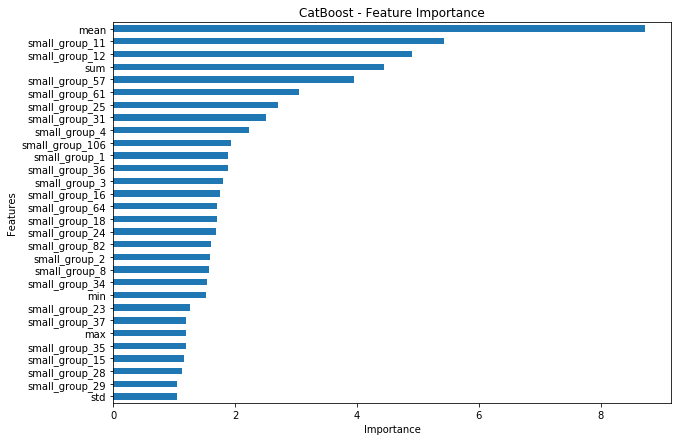

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt

fea_imp = pd.DataFrame({'imp': model4.feature_importances_, 'col': x_train_.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');

In [0]:
model.get_best_score()

{'learn': {'MultiClass': 0.52328798828125}}

In [0]:
import numpy as np

In [0]:
del X_test['client_id']
del X_test['max']

In [0]:
a = model4.predict(X_test)
a = np.squeeze(a, axis = 1)
a.shape

(20000,)

In [0]:
preds_class = model.predict(x_test_)

In [0]:
preds_class

array([[3.],
       [3.],
       [0.],
       ...,
       [1.],
       [3.],
       [3.]])

In [0]:
import numpy as np
preds_class = np.squeeze(preds_class, axis=1)

In [0]:
y_pred = model.predict(x_test_)
y_pred.shape

(6000, 1)

In [0]:
preds_class[0]

array([1.])

In [0]:
y_test_ = y_test_.to_numpy()

In [0]:
import numpy as np

In [0]:
size = preds_class.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6366666666666667, 385, 212, 152, 341)

In [0]:
 #{'depth': 6, 'iterations': 5000, 'learning_rate': 0.03}} the best

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

reat_train = Pool(data = X_train, label = y_train)

eval_dataset = Pool(data=x_test_, label=y_test_)

model1 = CatBoostClassifier(iterations=5000, loss_function='MultiClass', task_type="GPU" , learning_rate=0.03, depth = 6)
#model = CatBoostClassifier(task_type="GPU")

#model.fit(reat_train)
model1.fit(x_train_,
          y_train_,
          eval_set=eval_dataset,
          verbose=False)
preds_class1 = model1.predict(x_test_)
preds_class1 = np.squeeze(preds_class1, axis=1)
preds_class1

#

array([0., 1., 3., ..., 0., 2., 3.])

In [0]:
size = preds_class1.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if preds_class1[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6393333333333333, 382, 220, 147, 333)

In [0]:
%%time
param={'objective':'multi:softmax','num_class':4,'n_jobs':4,'seed':42}

xgb_model=xgb.XGBClassifier(**param, n_estimators=2000, tree_method='gpu_hist', predictor='gpu_predictor')
xgb_model.fit(x_train_,y_train_)

CPU times: user 11.6 s, sys: 5.65 s, total: 17.2 s
Wall time: 17 s


In [0]:
xgb_pred = xgb_model.predict(x_test_)
xgb_pred

array([0, 1, 3, ..., 0, 2, 3])

In [0]:
size = xgb_pred.shape[0]
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if xgb_pred[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6243333333333333, 405, 229, 152, 341)

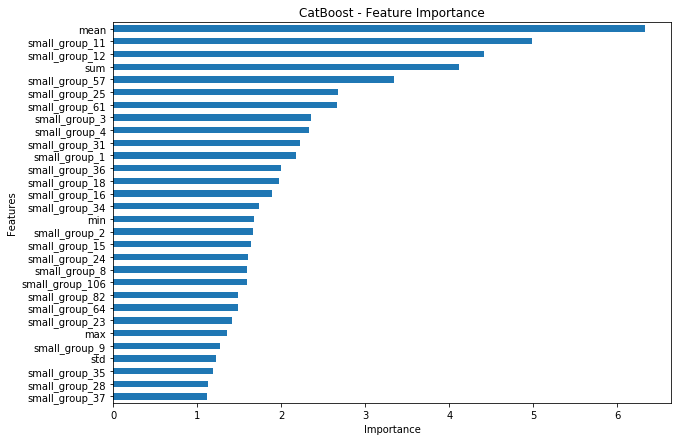

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt

fea_imp = pd.DataFrame({'imp': model.feature_importances_, 'col': x_train_.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');

In [0]:

from catboost import Pool, CatBoostClassifier

train_dataset = Pool(data=x_train_, label=y_train_)

eval_dataset = Pool(data=x_test_, label=y_test_)
model = CatBoostClassifier(iterations=3000, loss_function='MultiClass', task_type="GPU")
#model = CatBoostClassifier(task_type="GPU")

model.fit(train_dataset)
preds_cat = model.predict(eval_dataset)
preds_cat = np.squeeze(preds_cat, axis = 1)
preds_cat

In [0]:
def get_acc(y_test, pred):
    if type(pred) == 'numpy.ndarray':
        pred = pred.tolist()
    size = pred.shape[0]
    trues = 0
    for i in range(size):
        if y_pred[i] == y_test[i]:
            trues += 1
        else:
            
    return trues / size

In [0]:
get_acc(y_test_, sk_pred)

0.6086666666666667

Обучим xgboost на текущих признаках.

In [0]:
param={'objective':'multi:softprob','num_class':4,'n_jobs':4,'seed':42}

In [0]:
%%time
model=xgb.XGBClassifier(**param, learning_rate=0.05, n_estimators=1000, tree_method='gpu_hist', predictor='gpu_predictor')
model.fit(X_train,y_train)

CPU times: user 13.5 s, sys: 8.16 s, total: 21.7 s
Wall time: 21.7 s


Сделаем предсказание.

In [0]:
pred=model.predict(X_test)

In [0]:
pred

array([0, 2, 3, ..., 2, 2, 0])

На public лидерборде такое предсказание должно дать качество 0.6118.

### Подготовим файл для отправки в систему

In [0]:
submission = pd.DataFrame({'bins': a}, index=test.client_id)
submission.head()

,bins
client_id,
28571,0.0
27046,2.0
13240,3.0
19974,2.0
10505,1.0


Сохраняем прогноз на диск в папку submissions. Имя прогноза соответсвует дате и времени его создания, закодированными с помощью timestamp.

In [0]:
import time
import os

current_timestamp = int(time.time())
submission_path = 'submissions/{}.csv'.format(current_timestamp)

if not os.path.exists('submissions'):
    os.makedirs('submissions')

print(submission_path)
submission.to_csv(submission_path, index=True)

submissions/1578516947.csv


Теперь все готово! Можно отправлять решение.

#дальше всякий мусор

##H2O

In [0]:
!pip install h2o
import h2o
h2o.init()

     |████████████████████████████████| 123.7MB 91kB/s 
  Created wheel for h2o: filename=h2o-3.26.0.10-py2.py3-none-any.whl size=123719583 sha256=01f5b0229aac7150a78e22cabfe144bc08626c4ea4701a501e89555c20379191
  Stored in directory: /root/.cache/pip/wheels/7d/09/bc/23eaa75a5948deb1d6c88d9ee3a20f94bac7d9df6c55ec8aa3
Successfully built h2o
Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpy7dbvoyy
  JVM stdout: /tmp/tmpy7dbvoyy/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpy7dbvoyy/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.26.0.10
H2O cluster version age:,15 days
H2O cluster name:,H2O_from_python_unknownUser_qbrcui
H2O cluster total nodes:,1
H2O cluster free memory:,3 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


In [0]:
df = h2o.import_file('/content/data/small_group_description.csv')
type(df)

Parse progress: |█████████████████████████████████████████████████████████| 100%


h2o.frame.H2OFrame

In [0]:
type(train)

pandas.core.frame.DataFrame

In [0]:
train.to_csv('out.csv')

In [0]:
df = h2o.import_file('/content/out.csv')

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
y = 'bins'
x = df.columns
x.remove(y)
x.remove('client_id')
df[y] = df[y].asfactor()

In [0]:
from h2o.automl import H2OAutoML

In [0]:
aml = H2OAutoML(max_models = 10, seed = 1)
aml.train(x = x, y = y, training_frame = df)

AutoML progress: |████████████████████████████████████████████████████████| 100%


In [0]:
aml.leaderboard

model_id,mean_per_class_error,logloss,rmse,mse
XGBoost_1_AutoML_20191122_153558,0.391057,0.873348,0.560062,0.313669
XGBoost_2_AutoML_20191122_153558,0.392977,0.885568,0.567365,0.321903
StackedEnsemble_AllModels_AutoML_20191122_153558,0.399185,0.899668,0.56865,0.323363
StackedEnsemble_BestOfFamily_AutoML_20191122_153558,0.400948,0.903504,0.570634,0.325623
XGBoost_3_AutoML_20191122_153558,0.408757,0.944999,0.595611,0.354753
GLM_grid_1_AutoML_20191122_153558_model_1,0.508356,1.3667,0.744977,0.55499


In [0]:
a = aml.predict(h2o.import_file('/content/out_test.csv'))

Parse progress: |█████████████████████████████████████████████████████████| 100%
xgboost prediction progress: |████████████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small_group_0': substituting in a column of NaN
  warnings.warn(w)
/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small_group_1': substituting in a column of NaN
  warnings.warn(w)
/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small_group_2': substituting in a column of NaN
  warnings.warn(w)
/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small_group_3': substituting in a column of NaN
  warnings.warn(w)
/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small_group_4': substituting in a column of NaN
  warnings.warn(w)
/usr/local/lib/python3.6/dist-packages/h2o/job.py:70: UserWarning: Test/Validation dataset is missing column 'small

In [0]:
a.as_data_frame().as_matrix()[-12]

#LightGBM

In [0]:
import lightgbm as lgb

In [0]:
lgb_train = lgb.Dataset(x_train_, y_train_)
lgb_eval = lgb.Dataset(x_test_, y_test_, reference=lgb_train)

In [0]:
params = {
    'boosting_type': 'gbdt',
    #'metric': {'l2', 'l1'},
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0,
    'objective': 'multiclass',
    'num_class':4,
    'metric': 'multi_logloss'
}

In [0]:
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=1000,
                valid_sets=lgb_eval,
                early_stopping_rounds=5)

[1]	valid_0's multi_logloss: 1.36456
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's multi_logloss: 1.34396
[3]	valid_0's multi_logloss: 1.32531
[4]	valid_0's multi_logloss: 1.30778
[5]	valid_0's multi_logloss: 1.29097
[6]	valid_0's multi_logloss: 1.27518
[7]	valid_0's multi_logloss: 1.26013
[8]	valid_0's multi_logloss: 1.24638
[9]	valid_0's multi_logloss: 1.23351
[10]	valid_0's multi_logloss: 1.22146
[11]	valid_0's multi_logloss: 1.20977
[12]	valid_0's multi_logloss: 1.19887
[13]	valid_0's multi_logloss: 1.18854
[14]	valid_0's multi_logloss: 1.17853
[15]	valid_0's multi_logloss: 1.16879
[16]	valid_0's multi_logloss: 1.15977
[17]	valid_0's multi_logloss: 1.15155
[18]	valid_0's multi_logloss: 1.14356
[19]	valid_0's multi_logloss: 1.13583
[20]	valid_0's multi_logloss: 1.12868
[21]	valid_0's multi_logloss: 1.12155
[22]	valid_0's multi_logloss: 1.1144
[23]	valid_0's multi_logloss: 1.108
[24]	valid_0's multi_logloss: 1.10144
[25]	valid_0's multi_logloss: 1.09543
[

In [0]:
y_pred = gbm.predict(x_test_, num_iteration=gbm.best_iteration)

In [0]:
from sklearn.metrics import mean_squared_error
print('The rmse of prediction is:', mean_squared_error(y_test_, y_pred) ** 0.5)

ValueError: ignored

In [0]:
y_pred = y_pred.tolist()

In [0]:
lgb_preds = [0]*3000
for i in range(3000):
    lgb_preds[i] = y_pred[i].index(max(y_pred[i]))

In [0]:
size = 3000
trues = 0
first_er = 0
sec_er = 0
third_er = 0
four_er = 0
for i in range(size):
    if lgb_preds[i] == y_test_[i]:
        trues += 1
    else:
        if y_test_[i] == 0.:
            first_er += 1
        elif y_test_[i] == 1.:
            sec_er += 1
        elif y_test_[i] == 2.:
            third_er += 1
        else:
            four_er += 1
trues / size, first_er, sec_er, third_er, four_er

(0.6236666666666667, 413, 227, 160, 329)